In [2]:
!pip install jax[cuda12]==0.4.28

DEPRECATION: Loading egg at /home/mrwhite0racle/miniconda3/envs/flax/lib/python3.12/site-packages/flash_attn_jax-0.2.2-py3.12-linux-x86_64.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330
  Using cached jax-0.4.28-py3-none-any.whl.metadata (23 kB)
  Using cached jaxlib-0.4.28-cp312-cp312-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached jax_cuda12_plugin-0.4.28-cp312-cp312-manylinux2014_x86_64.whl.metadata (560 bytes)
  Using cached nvidia_cudnn_cu12-8.9.7.29-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached jax_cuda12_pjrt-0.4.28-py3-none-manylinux2014_x86_64.whl.metadata (349 bytes)
Using cached jax-0.4.28-py3-none-any.whl (1.9 MB)
Using cached jax_cuda12_plugin-0.4.28-cp312-cp312-manylinux2014_x86_64.whl (12.4 MB)
Using cached jaxlib-0.4.28-cp312-cp312-manylinux2014_x86_64.whl (77.6 MB)
Using cached jax_cuda12_pjrt-0

In [1]:

%load_ext dotenv
%dotenv

import tqdm
from flax import linen as nn
import jax
from typing import Dict, Callable, Sequence, Any, Union
from dataclasses import field
import jax.numpy as jnp
import tensorflow_datasets as tfds
import grain.python as pygrain
# import tensorflow as tf
import numpy as np
import augmax

import matplotlib.pyplot as plt
from clu import metrics
from flax.training import train_state  # Useful dataclass to keep train state
import optax
from flax import struct                # Flax dataclasses
import time
import os
from datetime import datetime
from flax.training import orbax_utils
import functools
from tensorflow_datasets.core.utils import gcs_utils
gcs_utils._is_gcs_disabled = True

# For CLIP
from transformers import AutoTokenizer, FlaxCLIPTextModel

There was a problem when trying to write in your cache folder (/home/mrwhite0racle/.cache/huggingface/hub). You should set the environment variable TRANSFORMERS_CACHE to a writable directory.


# Initialization

In [2]:
# Some Optimizations
import ctypes

_libcudart = ctypes.CDLL("libcudart.so")
# Set device limit on the current device
# cudaLimitMaxL2FetchGranularity = 0x05
pValue = ctypes.cast((ctypes.c_int * 1)(), ctypes.POINTER(ctypes.c_int))
_libcudart.cudaDeviceSetLimit(ctypes.c_int(0x05), ctypes.c_int(128))
_libcudart.cudaDeviceGetLimit(pValue, ctypes.c_int(0x05))
assert pValue.contents.value == 128
# tf.compat.v1.ConfigProto.force_gpu_compatible = True

# gpus = tf.config.list_physical_devices("GPU")
# if gpus:
#     try:
#         # Currently, memory growth needs to be the same across GPUs
#         for gpu in gpus:
#             tf.config.experimental.set_memory_growth(gpu, True)
#         logical_gpus = tf.config.list_logical_devices("GPU")
#         print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
#     except RuntimeError as e:
#         # Memory growth must be set before GPUs have been initialized
#         print(e)
        
# print(gpus)

In [3]:
normalizeImage = lambda x: jax.nn.standardize(x, mean=[127.5], std=[127.5])
denormalizeImage = lambda x: (x + 1.0) * 127.5


def plotImages(imgs, fig_size=(8, 8), dpi=100):
    fig = plt.figure(figsize=fig_size, dpi=dpi)
    imglen = imgs.shape[0]
    for i in range(imglen):
        plt.subplot(fig_size[0], fig_size[1], i + 1)
        plt.imshow(jnp.astype(denormalizeImage(imgs[i, :, :, :]), jnp.uint8))
        plt.axis("off")
    plt.show()

class RandomClass():
    def __init__(self, rng: jax.random.PRNGKey):
        self.rng = rng

    def get_random_key(self):
        self.rng, subkey = jax.random.split(self.rng)
        return subkey
    
    def get_sigmas(self, steps):
        return jnp.tan(self.theta_min + steps * (self.theta_max - self.theta_min)) / self.kappa

    def reset_random_key(self):
        self.rng = jax.random.PRNGKey(42)

class MarkovState(struct.PyTreeNode):
    pass

class RandomMarkovState(MarkovState):
    rng: jax.random.PRNGKey

    def get_random_key(self):
        rng, subkey = jax.random.split(self.rng)
        return RandomMarkovState(rng), subkey

# Data Pipeline

In [4]:
def defaultTextEncodeModel():
    modelname = "openai/clip-vit-large-patch14"
    model = FlaxCLIPTextModel.from_pretrained(modelname, dtype=jnp.float16)
    tokenizer = AutoTokenizer.from_pretrained(modelname, dtype=jnp.float16)
    return model, tokenizer

def encodePrompts(prompts, model, tokenizer=None):
    if model == None:
        model, tokenizer = defaultTextEncodeModel()
    if tokenizer == None:
        tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-large-patch14")

    # inputs = tokenizer(prompts, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="np")
    inputs = tokenizer(prompts, padding="max_length", max_length=12, truncation=True, return_tensors="np")

    outputs = model(**inputs)
    last_hidden_state = outputs.last_hidden_state
    pooler_output = outputs.pooler_output  # pooled (EOS token) states
    embed_pooled = pooler_output.astype(jnp.float16)
    embed_labels_full = last_hidden_state.astype(jnp.float16)
    
    return embed_pooled, embed_labels_full

In [5]:
def load_labels_oxford_flowers102(path):
    def load_labels():
        with open(path, "r") as f:
            textlabels = [i.strip() for i in f.readlines()]
        return textlabels
    return load_labels

# Configure the following for your datasets
dataToLabelGenMap = {
    "oxford_flowers102": load_labels_oxford_flowers102("/home/mrwhite0racle/tensorflow_datasets/oxford_flowers102/2.1.1/label.labels.txt"),
}

def get_dataset(data_name="oxford_flowers102", batch_size=64, image_scale=256, method=jax.image.ResizeMethod.LANCZOS3):
    data_source = tfds.data_source(data_name, split="all", try_gcs=False)
    
    gpu_device = jax.devices("gpu")[0]
    cpu_device = jax.devices("cpu")[0]
    
    print(f"Gpu Device: {gpu_device}, Cpu Device: {cpu_device}")
        
    def preprocess(image):
        # image = jax.device_put(image, device=jax.devices("cpu")[0])
        image = (image - 127.5) / 127.5
        image = jax.image.resize(image, (image_scale, image_scale, 3), method=method)
        image = jnp.clip(image, -1.0, 1.0)
        image = jax.device_put(image, device=jax.devices("gpu")[0]) 
        return  image
    
    preprocess = jax.jit(preprocess, backend="cpu")

    augments = augmax.Chain(
        augmax.HorizontalFlip(0.5),
        augmax.RandomContrast((-0.05, 0.05), 1.),
        augmax.RandomBrightness((-0.2, 0.2), 1.)
    )

    augments = jax.jit(augments, backend="cpu")
    
    if os.path.exists(f"./datacache/{data_name}_labels.pkl"):
        print("Loading labels from cache")
        with open(f"./datacache/{data_name}_labels.pkl", "rb") as f:
            import pickle
            embed = pickle.load(f)
            embed_labels = embed["embed_labels"]
            embed_labels_full = embed["embed_labels_full"]
            null_labels = embed["null_labels"]
            null_labels_full = embed["null_labels_full"]
    else:
        print("No cache found, generating labels")
        textlabels = dataToLabelGenMap[data_name]()
        
        model, tokenizer = defaultTextEncodeModel()

        embed_labels, embed_labels_full = encodePrompts(textlabels, model, tokenizer)
        embed_labels = embed_labels.tolist()
        embed_labels_full = embed_labels_full.tolist()
        
        null_labels, null_labels_full = encodePrompts([""], model, tokenizer)
        null_labels = null_labels.tolist()[0]
        null_labels_full = null_labels_full.tolist()[0]
        
        os.makedirs("./datacache", exist_ok=True)
        with open(f"./datacache/{data_name}_labels.pkl", "wb") as f:
            import pickle
            pickle.dump({
                "embed_labels": embed_labels,
                "embed_labels_full": embed_labels_full,
                "null_labels": null_labels,
                "null_labels_full": null_labels_full
                }, f)
        
    embed_labels = [np.array(i, dtype=np.float16) for i in embed_labels]
    embed_labels_full = [np.array(i, dtype=np.float16) for i in embed_labels_full]
    null_labels = np.array(null_labels, dtype=np.float16)
    null_labels_full  = np.array(null_labels_full, dtype=np.float16)
    
    def labelizer(labelidx:int) -> jnp.array:
        label_pooled = embed_labels[labelidx]
        label_seq = embed_labels_full[labelidx]
        # label_pooled = jax.device_put(label_pooled, device=jax.devices("gpu")[0])
        # label_seq = jax.device_put(label_seq, device=jax.devices("gpu")[0])
        return label_pooled, label_seq

    class augmenter(pygrain.RandomMapTransform):
        def random_map(self, element: Dict[str, Any], rng: np.random.Generator) ->  Dict[str, jnp.array]:
            image = element['image']
            image = preprocess(image)
            image = augments(rng.integers(0, 2**32, [2], dtype=np.uint32), image) 
            labelidx = element['label']
            label, label_seq = labelizer(labelidx)
            # image, label = move2gpu(image, label)
            return {'image':image, 'label':label, 'label_seq':label_seq}

    sampler = pygrain.IndexSampler(
        num_records=len(data_source),
        shuffle=True,
        seed=0,
        num_epochs=None,
        shard_options=pygrain.ShardByJaxProcess(),
    )

    transformations = [augmenter(), pygrain.Batch(batch_size, drop_remainder=True)]

    loader = pygrain.DataLoader(
        data_source=data_source,
        sampler=sampler,
        operations=transformations,
        worker_count=4,
        read_options=pygrain.ReadOptions(8, 500),
        worker_buffer_size=5
        )
    return {
        "loader": loader,
        "null_labels": null_labels,
        "null_labels_full": null_labels_full,
        "embed_labels": embed_labels,
        "embed_labels_full": embed_labels_full,
        "length": len(data_source),  
        "batch_size": batch_size,
        "image_size": image_scale
    }


In [6]:
data = get_dataset("oxford_flowers102", batch_size=32, image_scale=128)

Gpu Device: cuda:0, Cpu Device: TFRT_CPU_0
Loading labels from cache


In [ ]:
a = None
for batch in data['loader']:
    # print(batch.shape)
    plotImages(batch['image'], dpi=300)
    a = batch
    print(batch['label'].shape, batch['label_seq'].shape)
    # time.sleep(0.1)
    break

In [14]:
def benchmark(dataset, num_epochs=2):
    start_time = time.perf_counter()
    for epoch_num in range(num_epochs):
        i = 0
        for sample in tqdm.tqdm(dataset):
            # Performing a training step
            time.sleep(0.01)
            i += 1
        print(i)
    print("Execution time:", time.perf_counter() - start_time)

In [ ]:
benchmark(data)

# Noise Samplers

In [6]:
from flaxdiff.schedulers import CosineNoiseSchedule, NoiseScheduler, GeneralizedNoiseScheduler, KarrasVENoiseScheduler, EDMNoiseScheduler
from flaxdiff.predictors import VPredictionTransform, EpsilonPredictionTransform, DiffusionPredictionTransform, DirectPredictionTransform, KarrasPredictionTransform

# Modeling

## Metrics

## Callbacks

## Model Generator

In [7]:
# import jax.experimental.pallas.ops.gpu.attention
import jax.experimental.pallas.ops.attention

from flaxdiff.models.simple_unet import l2norm, ConvLayer, TimeEmbedding, TimeProjection, Upsample, Downsample, ResidualBlock, PixelShuffle
from flaxdiff.models.simple_unet import FourierEmbedding

from flaxdiff.models.attention import kernel_init
from flash_attn_jax import flash_mha
from flaxdiff.models.favor_fastattn import make_fast_generalized_attention, make_fast_softmax_attention

# Kernel initializer to use
def kernel_init(scale, dtype=jnp.float32):
    scale = max(scale, 1e-10)
    return nn.initializers.variance_scaling(scale=scale, mode="fan_avg", distribution="truncated_normal", dtype=dtype)

class FlashAttention(nn.Module):
    """
    Based on the flash attention implementation.
    """
    query_dim: int
    heads: int = 4
    dim_head: int = 64
    dtype: Any = jnp.float32
    precision: Any = jax.lax.Precision.HIGHEST
    use_bias: bool = True
    kernel_init: Callable = lambda : kernel_init(1.0)

    def setup(self):
        inner_dim = self.dim_head * self.heads
        # Weights were exported with old names {to_q, to_k, to_v, to_out}
        self.query = nn.DenseGeneral(inner_dim, use_bias=False, precision=self.precision, 
                                     kernel_init=self.kernel_init(), dtype=self.dtype, name="to_q")
        self.key = nn.DenseGeneral(inner_dim, use_bias=False, precision=self.precision, 
                                     kernel_init=self.kernel_init(), dtype=self.dtype, name="to_k")
        self.value = nn.DenseGeneral(inner_dim, use_bias=False, precision=self.precision, 
                                     kernel_init=self.kernel_init(), dtype=self.dtype, name="to_v")
        self.proj_attn = nn.DenseGeneral(self.query_dim, use_bias=False, precision=self.precision, 
                                     kernel_init=self.kernel_init(), dtype=self.dtype, name="to_out_0")
        # self.attnfn = make_fast_generalized_attention(qkv_dim=inner_dim, lax_scan_unroll=16)

    @nn.compact
    def __call__(self, x:jax.Array, context=None):
        # x has shape [B, H * W, C]
        context = x if context is None else context
        query = self.query(x)
        key = self.key(context)
        value = self.value(context)
        
        # hidden_states = flash_mha(
        #     query.astype(jnp.float16), key.astype(jnp.float16), value.astype(jnp.float16),
        # )
        
        hidden_states = jax.experimental.pallas.ops.attention.mha_reference(
            query, key, value, None
        )
        
        # hidden_states = self.attnfn(
        #     query, key, value, None
        # )
        
        proj = self.proj_attn(hidden_states)
        return proj


class NormalAttention(nn.Module):
    """
    Simple implementation of the normal attention.
    """
    query_dim: int
    heads: int = 4
    dim_head: int = 64
    dtype: Any = jnp.float32
    precision: Any = jax.lax.Precision.HIGHEST
    use_bias: bool = True
    kernel_init: Callable = lambda : kernel_init(1.0)

    def setup(self):
        inner_dim = self.dim_head * self.heads
        dense = functools.partial(
            nn.DenseGeneral,
            features=[self.heads, self.dim_head], 
            axis=-1, 
            precision=self.precision, 
            use_bias=self.use_bias, 
            kernel_init=self.kernel_init(), 
            dtype=self.dtype
        )
        self.query = dense(name="to_q")
        self.key = dense(name="to_k")
        self.value = dense(name="to_v")

        self.proj_attn = nn.DenseGeneral(
            self.query_dim, 
            axis=(-2, -1), 
            precision=self.precision, 
            use_bias=self.use_bias, 
            dtype=self.dtype, 
            name="to_out_0",
            kernel_init=self.kernel_init()
            # kernel_init=jax.nn.initializers.xavier_uniform()
        )

    @nn.compact
    def __call__(self, x, context=None):
        # x has shape [B, H, W, C]
        context = x if context is None else context
        query = self.query(x)
        key = self.key(context)
        value = self.value(context)
        
        hidden_states = nn.dot_product_attention(
            query, key, value, dtype=self.dtype, broadcast_dropout=False, dropout_rng=None, precision=self.precision
        )
        proj = self.proj_attn(hidden_states)
        return proj
    
class AttentionBlock(nn.Module):
    # Has self and cross attention
    query_dim: int
    heads: int = 4
    dim_head: int = 64
    dtype: Any = jnp.float32
    precision: Any = jax.lax.Precision.HIGHEST
    use_bias: bool = True
    kernel_init: Callable = lambda : kernel_init(1.0)
    use_flash_attention:bool = False
    use_cross_only:bool = False
    
    def setup(self):
        if self.use_flash_attention:
            attenBlock = FlashAttention
        else:
            attenBlock = NormalAttention
            
        self.attention1 = attenBlock(
         query_dim=self.query_dim,
            heads=self.heads,
            dim_head=self.dim_head,
            name=f'Attention1',
            precision=self.precision,
            use_bias=self.use_bias,
            dtype=self.dtype,
            kernel_init=self.kernel_init
        )
        self.attention2 = attenBlock(
            query_dim=self.query_dim,
            heads=self.heads,
            dim_head=self.dim_head,
            name=f'Attention2',
            precision=self.precision,
            use_bias=self.use_bias,
            dtype=self.dtype,
            kernel_init=self.kernel_init
        )
        
        self.ff = nn.DenseGeneral(
            features=self.query_dim,
            use_bias=self.use_bias,
            precision=self.precision,
            dtype=self.dtype,
            kernel_init=self.kernel_init(),
            name="ff"
        )
        self.norm1 = nn.RMSNorm(epsilon=1e-5, dtype=self.dtype)
        self.norm2 = nn.RMSNorm(epsilon=1e-5, dtype=self.dtype)
        self.norm3 = nn.RMSNorm(epsilon=1e-5, dtype=self.dtype)
        self.norm4 = nn.RMSNorm(epsilon=1e-5, dtype=self.dtype)
        
    @nn.compact
    def __call__(self, hidden_states, context=None):
        # self attention
        residual = hidden_states
        hidden_states = self.norm1(hidden_states)
        if self.use_cross_only:
            hidden_states = self.attention1(hidden_states, context)
        else:
            hidden_states = self.attention1(hidden_states)
        hidden_states = hidden_states + residual

        # cross attention
        residual = hidden_states
        hidden_states = self.norm2(hidden_states)
        hidden_states = self.attention2(hidden_states, context)
        hidden_states = hidden_states + residual

        # feed forward
        residual = hidden_states
        hidden_states = self.norm3(hidden_states)
        hidden_states = nn.gelu(hidden_states)
        hidden_states = self.ff(hidden_states)
        hidden_states = hidden_states + residual
        
        return hidden_states

class TransformerBlock(nn.Module):
    heads: int = 4
    dim_head: int = 32
    use_linear_attention: bool = True
    dtype: Any = jnp.float32
    precision: Any = jax.lax.Precision.HIGH
    use_projection: bool = False
    use_flash_attention:bool = True
    use_self_and_cross:bool = False

    @nn.compact
    def __call__(self, x, context=None):
        inner_dim = self.heads * self.dim_head
        B, H, W, C = x.shape
        normed_x = nn.RMSNorm(epsilon=1e-5, dtype=self.dtype)(x)
        if self.use_projection == True:
            if self.use_linear_attention:
                projected_x = nn.Dense(features=inner_dim, 
                                       use_bias=False, precision=self.precision, 
                                       kernel_init=kernel_init(1.0),
                                       dtype=self.dtype, name=f'project_in')(normed_x)
            else:
                projected_x = nn.Conv(
                    features=inner_dim, kernel_size=(1, 1),
                    kernel_init=kernel_init(1.0),
                    strides=(1, 1), padding='VALID', use_bias=False, dtype=self.dtype,
                    precision=self.precision, name=f'project_in_conv',
                )(normed_x)
        else:
            projected_x = normed_x
            inner_dim = C
            
        context = projected_x if context is None else context

        if self.use_self_and_cross:
            projected_x = AttentionBlock(
                query_dim=inner_dim,
                heads=self.heads,
                dim_head=self.dim_head,
                name=f'Attention',
                precision=self.precision,
                use_bias=False,
                dtype=self.dtype,
                use_flash_attention=self.use_flash_attention,
                use_cross_only=False
            )(projected_x, context)
        elif self.use_flash_attention == True:
            projected_x = FlashAttention(
                query_dim=inner_dim,
                heads=self.heads,
                dim_head=self.dim_head,
                name=f'Attention',
                precision=self.precision,
                use_bias=False,
                dtype=self.dtype,
            )(projected_x, context)
        else:
            projected_x = NormalAttention(
                query_dim=inner_dim,
                heads=self.heads,
                dim_head=self.dim_head,
                name=f'Attention',
                precision=self.precision,
                use_bias=False,
            )(projected_x, context)
        

        if self.use_projection == True:
            if self.use_linear_attention:
                projected_x = nn.Dense(features=C, precision=self.precision, 
                                       dtype=self.dtype, use_bias=False, 
                                       kernel_init=kernel_init(1.0),
                                       name=f'project_out')(projected_x)
            else:
                projected_x = nn.Conv(
                    features=C, kernel_size=(1, 1),
                    kernel_init=kernel_init(1.0),
                    strides=(1, 1), padding='VALID', use_bias=False, dtype=self.dtype,
                    precision=self.precision, name=f'project_out_conv',
                )(projected_x)

        out = x + projected_x
        return out


## Attention and other prototyping

In [15]:
x = jnp.ones((16, 16, 16, 64))
context = jnp.ones((16, 16, 16, 64))
attention_block = TransformerBlock(heads=4, dim_head=64//4, dtype=jnp.float32, use_flash_attention=True, use_projection=True, use_self_and_cross=True)
params = attention_block.init(jax.random.PRNGKey(0), x, context)
%timeit attention_block.apply(params, x, context)

15.3 ms ± 41.9 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [10]:
x = jnp.ones((1, 16, 16, 64))
context = jnp.ones((1, 12, 768))
# pad the context
context = jnp.pad(context, ((0, 0), (0, 4), (0, 0)), mode='constant', constant_values=0)
print(context.shape)
context = None#jnp.reshape(context, (1, 1, 16, 768))
attention_block = TransformerBlock(heads=4, dim_head=64//4, dtype=jnp.float16, use_flash_attention=True, use_projection=False, use_self_and_cross=False)
params = attention_block.init(jax.random.PRNGKey(0), x, context)
out = attention_block.apply(params, x, context)
print("Output :", out.shape)
print(attention_block.tabulate(jax.random.key(0), x, context, console_kwargs={"width": 200, "force_jupyter":True, }))
print(jnp.mean(out), jnp.std(out))
# plt.hist(out.flatten(), bins=100)
# %timeit attention_block.apply(params, x)

(1, 16, 768)
Output : (1, 16, 16, 64)


                                            TransformerBlock Summary                                            
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ path               ┃ module           ┃ inputs                ┃ outputs             ┃ params                 ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│                    │ TransformerBlock │ - float32[1,16,16,64] │ float32[1,16,16,64] │                        │
│                    │                  │ - None                │                     │                        │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│ RMSNorm_0          │ RMSNorm          │ float32[1,16,16,64]   │ float16[1,16,16,64] │ scale: float32[64]     │
│                    │                  │                       │                     │                        │
│                    │                  │                       │                     │ 64 (256 B)             │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│ Attention          │ FlashAttention   │ - float16[1,16,16,64] │ float16[1,16,16,64] │                        │
│                    │                  │ - float16[1,16,16,64] │                     │                        │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│ Attention/to_q     │ DenseGeneral     │ float16[1,16,16,64]   │ float16[1,16,16,64] │ kernel: float32[64,64] │
│                    │                  │                       │                     │                        │
│                    │                  │                       │                     │ 4,096 (16.4 KB)        │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│ Attention/to_k     │ DenseGeneral     │ float16[1,16,16,64]   │ float16[1,16,16,64] │ kernel: float32[64,64] │
│                    │                  │                       │                     │                        │
│                    │                  │                       │                     │ 4,096 (16.4 KB)        │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│ Attention/to_v     │ DenseGeneral     │ float16[1,16,16,64]   │ float16[1,16,16,64] │ kernel: float32[64,64] │
│                    │                  │                       │                     │                        │
│                    │                  │                       │                     │ 4,096 (16.4 KB)        │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│ Attention/to_out_0 │ DenseGeneral     │ float16[1,16,16,64]   │ float16[1,16,16,64] │ kernel: float32[64,64] │
│                    │                  │                       │                     │                        │
│                    │                  │                       │                     │ 4,096 (16.4 KB)        │
├────────────────────┼──────────────────┼───────────────────────┼─────────────────────┼────────────────────────┤
│                    │                  │                       │               Total │ 16,448 (65.8 KB)       │
└────────────────────┴──────────────────┴───────────────────────┴─────────────────────┴────────────────────────┘
                                                                                                                
                                       Total Parameters: 16,448 (65.8 KB)                                       




0.7969829 1.2281709


## Main Model

In [8]:
class ResidualBlock(nn.Module):
    conv_type:str
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    padding:str="SAME"
    activation:Callable=jax.nn.swish
    direction:str=None
    res:int=2
    norm_groups:int=8
    kernel_init:Callable=kernel_init(1.0)

    @nn.compact
    def __call__(self, x:jax.Array, temb:jax.Array, textemb:jax.Array=None, extra_features:jax.Array=None):
        residual = x
        out = nn.GroupNorm(self.norm_groups)(x)
        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv1"
        )(out)

        temb = nn.DenseGeneral(features=self.features, name="temb_projection")(temb)
        temb = jnp.expand_dims(jnp.expand_dims(temb, 1), 1)
        # scale, shift = jnp.split(temb, 2, axis=-1)
        # out = out * (1 + scale) + shift
        out = out + temb

        out = nn.GroupNorm(self.norm_groups)(out)
        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv2"
        )(out)

        if residual.shape != out.shape:
            residual = ConvLayer(
                self.conv_type,
                features=self.features,
                kernel_size=(1, 1),
                strides=1,
                kernel_init=self.kernel_init,
                name="residual_conv"
            )(residual)
        out = out + residual

        out = jnp.concatenate([out, extra_features], axis=-1) if extra_features is not None else out

        return out
    
class Unet(nn.Module):
    emb_features:int=64*4,
    feature_depths:list=[64, 128, 256, 512],
    attention_configs:list=[{"heads":8}, {"heads":8}, {"heads":8}, {"heads":8}],
    num_res_blocks:int=2,
    num_middle_res_blocks:int=1,
    activation:Callable = jax.nn.swish
    norm_groups:int=8

    @nn.compact
    def __call__(self, x, temb, textcontext=None):
        # print("embedding features", self.emb_features)
        temb = FourierEmbedding(features=self.emb_features)(temb)
        temb = TimeProjection(features=self.emb_features)(temb)
        
        _, TS, TC = textcontext.shape
        
        # print("time embedding", temb.shape)
        feature_depths = self.feature_depths
        attention_configs = self.attention_configs

        conv_type = up_conv_type = down_conv_type = middle_conv_type = "conv"
        # middle_conv_type = "separable"

        x = ConvLayer(
            conv_type,
            features=self.feature_depths[0],
            kernel_size=(3, 3),
            strides=(1, 1),
            kernel_init=kernel_init(1.0)
        )(x)
        downs = [x]

        # Downscaling blocks
        for i, (dim_out, attention_config) in enumerate(zip(feature_depths, attention_configs)):
            dim_in = x.shape[-1]
            # dim_in = dim_out
            for j in range(self.num_res_blocks):
                x = ResidualBlock(
                    down_conv_type,
                    name=f"down_{i}_residual_{j}",
                    features=dim_in,
                    kernel_init=kernel_init(1.0),
                    kernel_size=(3, 3),
                    strides=(1, 1),
                    activation=self.activation,
                    norm_groups=self.norm_groups
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    B, H, W, _ = x.shape
                    if H > TS:
                        padded_context = jnp.pad(textcontext, ((0, 0), (0, H - TS), (0, 0)), mode='constant', constant_values=0).reshape((B, 1, H, TC))
                    else:
                        padded_context = None
                    x = TransformerBlock(heads=attention_config['heads'], dtype=attention_config.get('dtype', jnp.float32),
                                       dim_head=dim_in // attention_config['heads'],
                                       use_flash_attention=attention_config.get("flash_attention", True),
                                       use_projection=attention_config.get("use_projection", False),
                                       use_self_and_cross=attention_config.get("use_self_and_cross", True),
                                       name=f"down_{i}_attention_{j}")(x, padded_context)
                # print("down residual for feature level", i, "is of shape", x.shape, "features", dim_in)
                downs.append(x)
            if i != len(feature_depths) - 1:
                # print("Downsample", i, x.shape)
                x = Downsample(
                    features=dim_out,
                    scale=2,
                    activation=self.activation,
                    name=f"down_{i}_downsample"
                )(x)

        # Middle Blocks
        middle_dim_out = self.feature_depths[-1]
        middle_attention = self.attention_configs[-1]
        for j in range(self.num_middle_res_blocks):
            x = ResidualBlock(
                middle_conv_type,
                name=f"middle_res1_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
                norm_groups=self.norm_groups
            )(x, temb)
            if middle_attention is not None and j == self.num_middle_res_blocks - 1:   # Apply attention only on the last block
                x = TransformerBlock(heads=middle_attention['heads'], dtype=middle_attention.get('dtype', jnp.float32), 
                                    dim_head=middle_dim_out // middle_attention['heads'],
                                    use_flash_attention=middle_attention.get("flash_attention", True),
                                    use_linear_attention=False,
                                    use_projection=middle_attention.get("use_projection", False),
                                    use_self_and_cross=False,
                                    name=f"middle_attention_{j}")(x)
            x = ResidualBlock(
                middle_conv_type,
                name=f"middle_res2_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
                norm_groups=self.norm_groups
            )(x, temb)

        # Upscaling Blocks
        for i, (dim_out, attention_config) in enumerate(zip(reversed(feature_depths), reversed(attention_configs))):
            # print("Upscaling", i, "features", dim_out)
            for j in range(self.num_res_blocks):
                x = jnp.concatenate([x, downs.pop()], axis=-1)
                # print("concat==> ", i, "concat", x.shape)
                # kernel_size = (1 + 2 * (j + 1), 1 + 2 * (j + 1))
                kernel_size = (3, 3)
                x = ResidualBlock(
                    up_conv_type,# if j == 0 else "separable",
                    name=f"up_{i}_residual_{j}",
                    features=dim_out,
                    kernel_init=kernel_init(1.0),
                    kernel_size=kernel_size,
                    strides=(1, 1),
                    activation=self.activation,
                    norm_groups=self.norm_groups
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    B, H, W, _ = x.shape
                    if H > TS:
                        padded_context = jnp.pad(textcontext, ((0, 0), (0, H - TS), (0, 0)), mode='constant', constant_values=0).reshape((B, 1, H, TC))
                    else:
                        padded_context = None
                    x = TransformerBlock(heads=attention_config['heads'], dtype=attention_config.get('dtype', jnp.float32), 
                                       dim_head=dim_out // attention_config['heads'],
                                       use_flash_attention=attention_config.get("flash_attention", True),
                                       use_projection=attention_config.get("use_projection", False),
                                       use_self_and_cross=attention_config.get("use_self_and_cross", True),
                                       name=f"up_{i}_attention_{j}")(x, padded_context)
            # print("Upscaling ", i, x.shape)
            if i != len(feature_depths) - 1:
                x = Upsample(
                    features=feature_depths[-i],
                    scale=2,
                    activation=self.activation,
                    name=f"up_{i}_upsample"
                )(x)

        # x = nn.GroupNorm(8)(x)
        x = ConvLayer(
            conv_type,
            features=self.feature_depths[0],
            kernel_size=(3, 3),
            strides=(1, 1),
            kernel_init=kernel_init(0.0)
        )(x)
    
        x = jnp.concatenate([x, downs.pop()], axis=-1)

        x = ResidualBlock(
            conv_type,
            name="final_residual",
            features=self.feature_depths[0],
            kernel_init=kernel_init(1.0),
            kernel_size=(3,3),
            strides=(1, 1),
            activation=self.activation,
            norm_groups=self.norm_groups
        )(x, temb)

        x = nn.GroupNorm(self.norm_groups)(x)
        x = self.activation(x)

        noise_out = ConvLayer(
            conv_type,
            features=3,
            kernel_size=(3, 3),
            strides=(1, 1),
            # activation=jax.nn.mish
            kernel_init=kernel_init(0.0)
        )(x)
        return noise_out#, attentions

# Training

In [9]:
BATCH_SIZE = 16
IMAGE_SIZE = 128

cosine_schedule = CosineNoiseSchedule(1000, beta_end=1)
karas_ve_schedule = KarrasVENoiseScheduler(1, sigma_max=80, rho=7, sigma_data=0.5)
edm_schedule = EDMNoiseScheduler(1, sigma_max=80, rho=7, sigma_data=0.5)

In [10]:
import orbax.checkpoint

@struct.dataclass
class Metrics(metrics.Collection):
  loss: metrics.Average.from_output('loss') # type: ignore

class ModelState():
    model: nn.Module
    params: dict
    noise_schedule: NoiseScheduler
    model_output_transform: DiffusionPredictionTransform

# Define the TrainState with EMA parameters
class TrainState(train_state.TrainState):
    rngs: jax.random.PRNGKey
    ema_params: dict

    def get_random_key(self):
        rngs, subkey = jax.random.split(self.rngs)
        return self.replace(rngs=rngs), subkey

    def apply_ema(self, decay: float=0.999):
        new_ema_params = jax.tree_util.tree_map(
            lambda ema, param: decay * ema + (1 - decay) * param,
            self.ema_params,
            self.params,
        )
        return self.replace(ema_params=new_ema_params)

class DiffusionTrainer:
    state : TrainState
    best_state : TrainState
    best_loss : float
    model : nn.Module
    noise_schedule : NoiseScheduler
    model_output_transform:DiffusionPredictionTransform
    ema_decay:float = 0.999
    
    def __init__(self, 
                 model:nn.Module, 
                 optimizer: optax.GradientTransformation,
                 noise_schedule:NoiseScheduler,
                 rngs:jax.random.PRNGKey,
                 image_size:int=64,
                 unconditional_prob:float=0.2,
                 train_state:TrainState=None,
                 name:str="Diffusion",
                 load_from_checkpoint:bool=False,
                 checkpoint_suffix:str="",
                 param_transforms:Callable=None,
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform(),
                 loss_fn=optax.l2_loss
                 ):
        self.model = model
        self.noise_schedule = noise_schedule
        self.name = name
        self.model_output_transform = model_output_transform
        self.loss_fn = loss_fn
        self.image_size = image_size
        self.unconditional_prob = unconditional_prob

        checkpointer = orbax.checkpoint.PyTreeCheckpointer()
        options = orbax.checkpoint.CheckpointManagerOptions(max_to_keep=4, create=True)
        self.checkpointer = orbax.checkpoint.CheckpointManager(self.checkpoint_path() + checkpoint_suffix, checkpointer, options)

        if load_from_checkpoint:
            latest_step, old_state, old_best_state = self.load()
        else:
            latest_step, old_state, old_best_state = 0, None, None
            
        self.latest_step = latest_step

        if train_state == None:
            self.init_state(optimizer, rngs, existing_state=old_state, existing_best_state=old_best_state, model=model, param_transforms=param_transforms)
        else:
            self.state = train_state
            self.best_state = train_state
            self.best_loss = 1e9

    def init_state(self, 
                   optimizer: optax.GradientTransformation, 
                   rngs:jax.random.PRNGKey,
                   existing_state:dict=None,
                   existing_best_state:dict=None,
                   model:nn.Module=None,
                    param_transforms:Callable=None,
                   ):
        inp = jnp.ones((1, self.image_size, self.image_size, 3))
        temb = jnp.ones((1,))
        textcontext = jnp.ones((1, 12, 768))
        rngs, subkey = jax.random.split(rngs)

        if existing_state == None:
            params = model.init(subkey, inp, temb, textcontext)
            existing_state = {"params":params, "ema_params":params}

        if param_transforms is not None:
            params = param_transforms(params)
        self.best_loss = 1e9
        self.state = TrainState.create(
            apply_fn=model.apply,
            params=existing_state['params'],
            ema_params=existing_state['ema_params'],
            tx=optimizer,
            rngs=rngs,
        )
        if existing_best_state is not None:
            self.best_state = self.state.replace(params=existing_best_state['params'], ema_params=existing_best_state['ema_params'])
        else:
            self.best_state = self.state

    def checkpoint_path(self):
        experiment_name = self.name
        path = os.path.join(os.path.abspath('./checkpoints'), experiment_name)
        if not os.path.exists(path):
            os.makedirs(path)
        return path

    def load(self):
        step = self.checkpointer.latest_step()
        print("Loading model from checkpoint", step)
        ckpt = self.checkpointer.restore(step)
        state = ckpt['state']
        best_state = ckpt['best_state']
        # Convert the state to a TrainState
        self.best_loss = ckpt['best_loss']
        print(f"Loaded model from checkpoint at step {step}", ckpt['best_loss'])
        return step, state, best_state

    def save(self, epoch=0):
        print(f"Saving model at epoch {epoch}")
        # filename = os.path.join(self.checkpoint_path(), f'model_{epoch}' if not best else 'best_model')
        ckpt = {
            'model': self.model,
            'state': self.state,
            'best_state': self.best_state,
            'best_loss': self.best_loss
        }
        save_args = orbax_utils.save_args_from_target(ckpt)
        self.checkpointer.save(epoch, ckpt, save_kwargs={'save_args': save_args}, force=True)

    def summary(self):
        inp = jnp.ones((1, self.image_size, self.image_size, 3))
        temb = jnp.ones((1,))
        textcontext = jnp.ones((1, 12, 768))
        print(self.model.tabulate(jax.random.key(0), inp, temb, textcontext, console_kwargs={"width": 200, "force_jupyter":True, }))

    def _define_train_step(self, batch_size, null_labels_seq):
        noise_schedule = self.noise_schedule
        model = self.model
        model_output_transform = self.model_output_transform
        loss_fn = self.loss_fn
        unconditional_prob = self.unconditional_prob
        
        # Determine the number of unconditional samples
        num_unconditional = int(batch_size * unconditional_prob)
        
        nS, nC = null_labels_seq.shape
        null_labels_seq = jnp.broadcast_to(null_labels_seq, (batch_size, nS, nC))
        
        @jax.jit
        def train_step(state:TrainState, batch):
            """Train for a single step."""
            images = batch['image']
            label_seq = batch['label_seq']
            
            # Generate random probabilities to decide how much of this batch will be unconditional
            # state, rngs = state.get_random_key()
            # random_prob = jax.random.uniform(rngs, (batch_size,), dtype=jnp.float16)
            # is_unconditional = random_prob < unconditional_prob
            # # Replace label_seq with null_labels_seq based on the probability
            # label_seq = jax.lax.select(is_unconditional[:, None, None], null_labels_seq, label_seq)
            
            label_seq = jnp.concat([null_labels_seq[:num_unconditional], label_seq[num_unconditional:]], axis=0)

            noise_level, state = noise_schedule.generate_timesteps(images.shape[0], state)
            state, rngs = state.get_random_key()
            noise:jax.Array = jax.random.normal(rngs, shape=images.shape)
            rates = noise_schedule.get_rates(noise_level)
            noisy_images, c_in, expected_output = model_output_transform.forward_diffusion(images, noise, rates)
            def model_loss(params):
                preds = model.apply(params, *noise_schedule.transform_inputs(noisy_images*c_in, noise_level), label_seq)
                preds = model_output_transform.pred_transform(noisy_images, preds, rates)
                nloss = loss_fn(preds, expected_output)
                # nloss = jnp.mean(nloss, axis=1)
                nloss *= noise_schedule.get_weights(noise_level)
                nloss = jnp.mean(nloss)
                loss = nloss
                return loss
            loss, grads = jax.value_and_grad(model_loss)(state.params)
            state = state.apply_gradients(grads=grads) 
            state = state.apply_ema(self.ema_decay)
            return state, loss
        return train_step
    
    def _define_compute_metrics(self):
        @jax.jit
        def compute_metrics(state:TrainState, expected, pred):
            loss = jnp.mean(jnp.square(pred - expected))
            metric_updates = state.metrics.single_from_model_output(loss=loss)
            metrics = state.metrics.merge(metric_updates)
            state = state.replace(metrics=metrics)
            return state
        return compute_metrics

    def fit(self, data, steps_per_epoch, epochs):
        loader = data['loader']
        null_labels_full = data['null_labels_full']
        batch_size = data['batch_size']
        loader = iter(loader)
        train_step = self._define_train_step(batch_size, null_labels_full)
        compute_metrics = self._define_compute_metrics()
        state = self.state
        for epoch in range(epochs):
            current_epoch = self.latest_step + epoch + 1
            print(f"\nEpoch {current_epoch}/{epochs}")
            start_time = time.time()
            epoch_loss = 0
            with tqdm.tqdm(total=steps_per_epoch, desc=f'\t\tEpoch {current_epoch}', ncols=100, unit='step') as pbar:
                for i in range(steps_per_epoch):
                    batch = next(loader)
                    state, loss = train_step(state, batch)
                    epoch_loss += loss
                    if i % 100 == 0:
                        pbar.set_postfix(loss=f'{loss:.4f}')
                        pbar.update(100)
            end_time = time.time()
            self.state = state
            total_time = end_time - start_time
            avg_time_per_step = total_time / steps_per_epoch
            avg_loss = epoch_loss / steps_per_epoch
            if avg_loss < self.best_loss:
                self.best_loss = avg_loss
                self.best_state = state
                self.save(current_epoch)
            print(f"\n\tEpoch {current_epoch} completed. Avg Loss: {avg_loss}, Time: {total_time:.2f}s, Best Loss: {self.best_loss}")
        self.save(epochs)
        return self.state


In [11]:
# experiment_name = "{name}_{date}".format(
#     name="Diffusion_SDE_VE_TEXT", date=datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
# )
experiment_name = 'Diffusion_SDE_VE_TEXT_2024-07-16_02:16:07'
# experiment_name = 'Diffusion_SDE_VE_TEXT_2024-07-21_02:12:40'
print("Experiment_Name:", experiment_name)
unet = Unet(emb_features=256, 
            feature_depths=[64, 64, 128, 256, 512],
            attention_configs=[
                None, #{"heads":8, "dtype":jnp.float16, "flash_attention":True}, 
                # {"heads":8, "dtype":jnp.float32, "flash_attention":True, "use_projection":True, "use_self_and_cross":True}, 
                # {"heads":8, "dtype":jnp.float32, "flash_attention":True, "use_projection":True, "use_self_and_cross":True}, 
                # {"heads":8, "dtype":jnp.float32, "flash_attention":True, "use_projection":True, "use_self_and_cross":True}, 
                # {"heads":8, "dtype":jnp.float32, "flash_attention":False, "use_projection":False, "use_self_and_cross":False}
                
                
                {"heads":8, "dtype":jnp.float16, "flash_attention":True, "use_projection":False, "use_self_and_cross":False}, 
                {"heads":8, "dtype":jnp.float16, "flash_attention":True, "use_projection":False, "use_self_and_cross":False}, 
                {"heads":8, "dtype":jnp.float16, "flash_attention":True, "use_projection":False, "use_self_and_cross":False}, 
                {"heads":8, "dtype":jnp.float16, "flash_attention":False, "use_projection":False, "use_self_and_cross":False}
                ],
            num_res_blocks=2,
            num_middle_res_blocks=1
)

data = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
datalen = data['length']
batches = datalen // BATCH_SIZE

# Suggested configurations
total_epochs = 2000
steps_per_epoch = batches
init_value = 1e-6
peak_value = 2e-4
warmup_steps = steps_per_epoch * 5
decay_steps = total_epochs * steps_per_epoch - warmup_steps
end_value = 1e-6
exponent = 1.0

# # Create the learning rate schedule
# learning_rate_schedule = optax.warmup_cosine_decay_schedule(
#     init_value=init_value,
#     peak_value=peak_value,
#     warmup_steps=warmup_steps,
#     decay_steps=decay_steps,
#     end_value=end_value,
#     exponent=exponent
# )

# solver = optax.adamw(learning_rate=learning_rate_schedule)
# solver = optax.radam(2e-4)
# solver = optax.adam(2e-4)
solver = optax.adamw(1e-5)

# solver = optax.lookahead(solver, sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)

trainer = DiffusionTrainer(unet, optimizer=solver, 
                           noise_schedule=edm_schedule,
                           rngs=jax.random.PRNGKey(4), 
                           name=experiment_name,
                           model_output_transform=KarrasPredictionTransform(sigma_data=edm_schedule.sigma_data),
                           image_size=IMAGE_SIZE,
                        #    train_state=trainer.best_state,
                        #    loss_fn=lambda x, y: jnp.abs(x - y),
                            # param_transforms=params_transform,
                           load_from_checkpoint=True,
                           )
#trainer.summary()

Experiment_Name: Diffusion_SDE_VE_TEXT_2024-07-16_02:16:07
Gpu Device: cuda:0, Cpu Device: TFRT_CPU_0
Loading labels from cache
Loading model from checkpoint 1720
Loaded model from checkpoint at step 1720 0.06479343


In [ ]:
trainer.summary()

In [12]:
data = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, batches, epochs=4000)

		Epoch 2408: 600step [00:51, 11.66step/s, loss=0.0581]                                             



	Epoch 2408 completed. Avg Loss: 0.06615827232599258, Time: 51.45s, Best Loss: 0.0647725760936737

Epoch 2409/4000


		Epoch 2409: 600step [00:54, 11.04step/s, loss=0.0622]                                             



	Epoch 2409 completed. Avg Loss: 0.06594036519527435, Time: 54.34s, Best Loss: 0.0647725760936737

Epoch 2410/4000


		Epoch 2410: 600step [00:55, 10.90step/s, loss=0.0609]                                             



	Epoch 2410 completed. Avg Loss: 0.06579571217298508, Time: 55.06s, Best Loss: 0.0647725760936737

Epoch 2411/4000


		Epoch 2411: 600step [00:52, 11.38step/s, loss=0.0721]                                             



	Epoch 2411 completed. Avg Loss: 0.06621237099170685, Time: 52.72s, Best Loss: 0.0647725760936737

Epoch 2412/4000


		Epoch 2412: 600step [00:51, 11.58step/s, loss=0.0905]                                             



	Epoch 2412 completed. Avg Loss: 0.0656392052769661, Time: 51.83s, Best Loss: 0.0647725760936737

Epoch 2413/4000


		Epoch 2413: 600step [00:52, 11.39step/s, loss=0.0431]                                             



	Epoch 2413 completed. Avg Loss: 0.06541933864355087, Time: 52.69s, Best Loss: 0.0647725760936737

Epoch 2414/4000


		Epoch 2414: 600step [00:51, 11.71step/s, loss=0.0634]                                             



	Epoch 2414 completed. Avg Loss: 0.0653490200638771, Time: 51.24s, Best Loss: 0.0647725760936737

Epoch 2415/4000


		Epoch 2415: 600step [00:50, 11.91step/s, loss=0.0634]                                             



	Epoch 2415 completed. Avg Loss: 0.06645803153514862, Time: 50.38s, Best Loss: 0.0647725760936737

Epoch 2416/4000


		Epoch 2416: 600step [00:50, 11.92step/s, loss=0.0824]                                             



	Epoch 2416 completed. Avg Loss: 0.06584551930427551, Time: 50.34s, Best Loss: 0.0647725760936737

Epoch 2417/4000


		Epoch 2417: 600step [00:50, 11.94step/s, loss=0.0563]                                             



	Epoch 2417 completed. Avg Loss: 0.06596089899539948, Time: 50.25s, Best Loss: 0.0647725760936737

Epoch 2418/4000


		Epoch 2418: 600step [00:50, 11.93step/s, loss=0.0661]                                             



	Epoch 2418 completed. Avg Loss: 0.06586707383394241, Time: 50.32s, Best Loss: 0.0647725760936737

Epoch 2419/4000


		Epoch 2419: 600step [00:48, 12.30step/s, loss=0.0711]                                             



	Epoch 2419 completed. Avg Loss: 0.0668618455529213, Time: 48.77s, Best Loss: 0.0647725760936737

Epoch 2420/4000


		Epoch 2420: 600step [00:50, 11.87step/s, loss=0.0652]                                             



	Epoch 2420 completed. Avg Loss: 0.06622524559497833, Time: 50.56s, Best Loss: 0.0647725760936737

Epoch 2421/4000


		Epoch 2421: 600step [00:50, 11.92step/s, loss=0.0819]                                             



	Epoch 2421 completed. Avg Loss: 0.06592590361833572, Time: 50.32s, Best Loss: 0.0647725760936737

Epoch 2422/4000


		Epoch 2422: 600step [00:49, 12.22step/s, loss=0.0658]                                             



	Epoch 2422 completed. Avg Loss: 0.06556672602891922, Time: 49.09s, Best Loss: 0.0647725760936737

Epoch 2423/4000


		Epoch 2423: 600step [00:49, 12.03step/s, loss=0.0504]                                             


Saving model at epoch 2423

	Epoch 2423 completed. Avg Loss: 0.06463424116373062, Time: 49.87s, Best Loss: 0.06463424116373062

Epoch 2424/4000


		Epoch 2424: 600step [00:48, 12.37step/s, loss=0.0561]                                             



	Epoch 2424 completed. Avg Loss: 0.06611697375774384, Time: 48.50s, Best Loss: 0.06463424116373062

Epoch 2425/4000


		Epoch 2425: 600step [00:48, 12.34step/s, loss=0.0648]                                             



	Epoch 2425 completed. Avg Loss: 0.0661054402589798, Time: 48.62s, Best Loss: 0.06463424116373062

Epoch 2426/4000


		Epoch 2426: 600step [00:49, 12.04step/s, loss=0.0770]                                             



	Epoch 2426 completed. Avg Loss: 0.06606210768222809, Time: 49.85s, Best Loss: 0.06463424116373062

Epoch 2427/4000


		Epoch 2427: 600step [00:49, 12.15step/s, loss=0.0587]                                             



	Epoch 2427 completed. Avg Loss: 0.06605029106140137, Time: 49.37s, Best Loss: 0.06463424116373062

Epoch 2428/4000


		Epoch 2428: 600step [00:48, 12.45step/s, loss=0.0600]                                             



	Epoch 2428 completed. Avg Loss: 0.06571951508522034, Time: 48.19s, Best Loss: 0.06463424116373062

Epoch 2429/4000


		Epoch 2429: 600step [00:49, 12.12step/s, loss=0.1091]                                             



	Epoch 2429 completed. Avg Loss: 0.06646855175495148, Time: 49.52s, Best Loss: 0.06463424116373062

Epoch 2430/4000


		Epoch 2430: 600step [00:49, 12.15step/s, loss=0.0703]                                             



	Epoch 2430 completed. Avg Loss: 0.06567863374948502, Time: 49.39s, Best Loss: 0.06463424116373062

Epoch 2431/4000


		Epoch 2431: 600step [00:48, 12.29step/s, loss=0.0817]                                             



	Epoch 2431 completed. Avg Loss: 0.06605996191501617, Time: 48.83s, Best Loss: 0.06463424116373062

Epoch 2432/4000


		Epoch 2432: 600step [00:49, 12.09step/s, loss=0.0857]                                             



	Epoch 2432 completed. Avg Loss: 0.06600518524646759, Time: 49.64s, Best Loss: 0.06463424116373062

Epoch 2433/4000


		Epoch 2433: 600step [00:48, 12.34step/s, loss=0.0744]                                             



	Epoch 2433 completed. Avg Loss: 0.06560806185007095, Time: 48.63s, Best Loss: 0.06463424116373062

Epoch 2434/4000


		Epoch 2434: 600step [00:47, 12.64step/s, loss=0.0617]                                             



	Epoch 2434 completed. Avg Loss: 0.06550560146570206, Time: 47.46s, Best Loss: 0.06463424116373062

Epoch 2435/4000


		Epoch 2435: 600step [00:48, 12.31step/s, loss=0.0643]                                             



	Epoch 2435 completed. Avg Loss: 0.06627722084522247, Time: 48.73s, Best Loss: 0.06463424116373062

Epoch 2436/4000


		Epoch 2436: 600step [00:49, 12.22step/s, loss=0.0649]                                             



	Epoch 2436 completed. Avg Loss: 0.06498236209154129, Time: 49.11s, Best Loss: 0.06463424116373062

Epoch 2437/4000


		Epoch 2437: 600step [00:49, 12.23step/s, loss=0.0746]                                             



	Epoch 2437 completed. Avg Loss: 0.06552062183618546, Time: 49.04s, Best Loss: 0.06463424116373062

Epoch 2438/4000


		Epoch 2438: 600step [00:49, 12.14step/s, loss=0.0561]                                             



	Epoch 2438 completed. Avg Loss: 0.06546440720558167, Time: 49.41s, Best Loss: 0.06463424116373062

Epoch 2439/4000


		Epoch 2439: 600step [00:48, 12.27step/s, loss=0.0591]                                             



	Epoch 2439 completed. Avg Loss: 0.06635064631700516, Time: 48.89s, Best Loss: 0.06463424116373062

Epoch 2440/4000


		Epoch 2440: 600step [00:48, 12.36step/s, loss=0.0603]                                             



	Epoch 2440 completed. Avg Loss: 0.06525883078575134, Time: 48.53s, Best Loss: 0.06463424116373062

Epoch 2441/4000


		Epoch 2441: 600step [00:50, 11.81step/s, loss=0.0492]                                             



	Epoch 2441 completed. Avg Loss: 0.06661105155944824, Time: 50.80s, Best Loss: 0.06463424116373062

Epoch 2442/4000


		Epoch 2442: 600step [00:48, 12.26step/s, loss=0.0659]                                             



	Epoch 2442 completed. Avg Loss: 0.06552568078041077, Time: 48.92s, Best Loss: 0.06463424116373062

Epoch 2443/4000


		Epoch 2443: 600step [00:48, 12.49step/s, loss=0.0698]                                             



	Epoch 2443 completed. Avg Loss: 0.06547799706459045, Time: 48.06s, Best Loss: 0.06463424116373062

Epoch 2444/4000


		Epoch 2444: 600step [00:47, 12.60step/s, loss=0.0607]                                             



	Epoch 2444 completed. Avg Loss: 0.06656717509031296, Time: 47.63s, Best Loss: 0.06463424116373062

Epoch 2445/4000


		Epoch 2445: 600step [00:49, 12.14step/s, loss=0.0986]                                             



	Epoch 2445 completed. Avg Loss: 0.06593574583530426, Time: 49.41s, Best Loss: 0.06463424116373062

Epoch 2446/4000


		Epoch 2446: 600step [00:49, 12.12step/s, loss=0.0735]                                             



	Epoch 2446 completed. Avg Loss: 0.06636840850114822, Time: 49.51s, Best Loss: 0.06463424116373062

Epoch 2447/4000


		Epoch 2447: 600step [00:50, 11.78step/s, loss=0.0651]                                             



	Epoch 2447 completed. Avg Loss: 0.06598901748657227, Time: 50.94s, Best Loss: 0.06463424116373062

Epoch 2448/4000


		Epoch 2448: 600step [00:47, 12.51step/s, loss=0.0926]                                             



	Epoch 2448 completed. Avg Loss: 0.06647039204835892, Time: 47.97s, Best Loss: 0.06463424116373062

Epoch 2449/4000


		Epoch 2449: 600step [00:47, 12.53step/s, loss=0.0543]                                             



	Epoch 2449 completed. Avg Loss: 0.06581009924411774, Time: 47.88s, Best Loss: 0.06463424116373062

Epoch 2450/4000


		Epoch 2450: 600step [00:49, 12.21step/s, loss=0.0576]                                             



	Epoch 2450 completed. Avg Loss: 0.06618692725896835, Time: 49.14s, Best Loss: 0.06463424116373062

Epoch 2451/4000


		Epoch 2451: 600step [00:49, 12.18step/s, loss=0.0716]                                             



	Epoch 2451 completed. Avg Loss: 0.06564844399690628, Time: 49.27s, Best Loss: 0.06463424116373062

Epoch 2452/4000


		Epoch 2452: 600step [00:48, 12.28step/s, loss=0.0630]                                             



	Epoch 2452 completed. Avg Loss: 0.06566400825977325, Time: 48.85s, Best Loss: 0.06463424116373062

Epoch 2453/4000


		Epoch 2453: 600step [00:48, 12.40step/s, loss=0.0969]                                             



	Epoch 2453 completed. Avg Loss: 0.06688865274190903, Time: 48.40s, Best Loss: 0.06463424116373062

Epoch 2454/4000


		Epoch 2454: 600step [00:49, 12.13step/s, loss=0.0658]                                             



	Epoch 2454 completed. Avg Loss: 0.06609208881855011, Time: 49.46s, Best Loss: 0.06463424116373062

Epoch 2455/4000


		Epoch 2455: 600step [00:48, 12.45step/s, loss=0.0546]                                             



	Epoch 2455 completed. Avg Loss: 0.0660422146320343, Time: 48.20s, Best Loss: 0.06463424116373062

Epoch 2456/4000


		Epoch 2456: 600step [00:48, 12.26step/s, loss=0.0670]                                             



	Epoch 2456 completed. Avg Loss: 0.0666862353682518, Time: 48.94s, Best Loss: 0.06463424116373062

Epoch 2457/4000


		Epoch 2457: 600step [00:48, 12.36step/s, loss=0.0568]                                             



	Epoch 2457 completed. Avg Loss: 0.06672961264848709, Time: 48.56s, Best Loss: 0.06463424116373062

Epoch 2458/4000


		Epoch 2458: 600step [00:49, 12.24step/s, loss=0.0715]                                             



	Epoch 2458 completed. Avg Loss: 0.06594036519527435, Time: 49.02s, Best Loss: 0.06463424116373062

Epoch 2459/4000


		Epoch 2459: 600step [00:49, 12.17step/s, loss=0.0583]                                             



	Epoch 2459 completed. Avg Loss: 0.06605127453804016, Time: 49.31s, Best Loss: 0.06463424116373062

Epoch 2460/4000


		Epoch 2460: 600step [00:48, 12.35step/s, loss=0.0758]                                             



	Epoch 2460 completed. Avg Loss: 0.06596628576517105, Time: 48.58s, Best Loss: 0.06463424116373062

Epoch 2461/4000


		Epoch 2461: 600step [00:47, 12.70step/s, loss=0.0595]                                             



	Epoch 2461 completed. Avg Loss: 0.06566688418388367, Time: 47.24s, Best Loss: 0.06463424116373062

Epoch 2462/4000


		Epoch 2462: 600step [00:47, 12.63step/s, loss=0.0593]                                             



	Epoch 2462 completed. Avg Loss: 0.0650913342833519, Time: 47.50s, Best Loss: 0.06463424116373062

Epoch 2463/4000


		Epoch 2463: 600step [00:49, 12.06step/s, loss=0.0621]                                             



	Epoch 2463 completed. Avg Loss: 0.06551334261894226, Time: 49.74s, Best Loss: 0.06463424116373062

Epoch 2464/4000


		Epoch 2464: 600step [00:49, 12.24step/s, loss=0.0756]                                             



	Epoch 2464 completed. Avg Loss: 0.06549657881259918, Time: 49.00s, Best Loss: 0.06463424116373062

Epoch 2465/4000


		Epoch 2465: 600step [00:50, 11.93step/s, loss=0.0681]                                             



	Epoch 2465 completed. Avg Loss: 0.06631976366043091, Time: 50.29s, Best Loss: 0.06463424116373062

Epoch 2466/4000


		Epoch 2466: 600step [00:48, 12.41step/s, loss=0.0605]                                             



	Epoch 2466 completed. Avg Loss: 0.06498096138238907, Time: 48.35s, Best Loss: 0.06463424116373062

Epoch 2467/4000


		Epoch 2467: 600step [00:49, 12.14step/s, loss=0.0693]                                             



	Epoch 2467 completed. Avg Loss: 0.06635788828134537, Time: 49.42s, Best Loss: 0.06463424116373062

Epoch 2468/4000


		Epoch 2468: 600step [00:47, 12.52step/s, loss=0.0639]                                             



	Epoch 2468 completed. Avg Loss: 0.0656944289803505, Time: 47.91s, Best Loss: 0.06463424116373062

Epoch 2469/4000


		Epoch 2469: 600step [00:47, 12.61step/s, loss=0.0683]                                             



	Epoch 2469 completed. Avg Loss: 0.06587543338537216, Time: 47.60s, Best Loss: 0.06463424116373062

Epoch 2470/4000


		Epoch 2470: 600step [00:47, 12.55step/s, loss=0.0759]                                             



	Epoch 2470 completed. Avg Loss: 0.06535058468580246, Time: 47.81s, Best Loss: 0.06463424116373062

Epoch 2471/4000


		Epoch 2471: 600step [00:47, 12.55step/s, loss=0.0715]                                             



	Epoch 2471 completed. Avg Loss: 0.06509117037057877, Time: 47.82s, Best Loss: 0.06463424116373062

Epoch 2472/4000


		Epoch 2472: 600step [00:47, 12.58step/s, loss=0.0597]                                             



	Epoch 2472 completed. Avg Loss: 0.06684540212154388, Time: 47.69s, Best Loss: 0.06463424116373062

Epoch 2473/4000


		Epoch 2473: 600step [00:48, 12.34step/s, loss=0.0782]                                             



	Epoch 2473 completed. Avg Loss: 0.06603162735700607, Time: 48.61s, Best Loss: 0.06463424116373062

Epoch 2474/4000


		Epoch 2474: 600step [00:47, 12.67step/s, loss=0.0614]                                             



	Epoch 2474 completed. Avg Loss: 0.06590364873409271, Time: 47.34s, Best Loss: 0.06463424116373062

Epoch 2475/4000


		Epoch 2475: 600step [00:48, 12.42step/s, loss=0.0621]                                             



	Epoch 2475 completed. Avg Loss: 0.06626661866903305, Time: 48.30s, Best Loss: 0.06463424116373062

Epoch 2476/4000


		Epoch 2476: 600step [00:51, 11.74step/s, loss=0.0636]                                             



	Epoch 2476 completed. Avg Loss: 0.06546580791473389, Time: 51.11s, Best Loss: 0.06463424116373062

Epoch 2477/4000


		Epoch 2477:  39%|████████████▌                   | 200/511 [00:10<00:19, 15.80step/s, loss=0.0586]

In [12]:
data = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, batches, epochs=2000)

Gpu Device: cuda:0, Cpu Device: TFRT_CPU_0
Loading labels from cache

Epoch 1/2000


		Epoch 1: 600step [01:36,  6.21step/s, loss=0.1270]                                                


Saving model at epoch 1

	Epoch 1 completed. Avg Loss: 0.2769903838634491, Time: 96.63s, Best Loss: 0.2769903838634491

Epoch 2/2000


		Epoch 2: 600step [00:52, 11.34step/s, loss=0.1334]                                                


Saving model at epoch 2

	Epoch 2 completed. Avg Loss: 0.12662605941295624, Time: 52.89s, Best Loss: 0.12662605941295624

Epoch 3/2000


		Epoch 3: 600step [00:52, 11.36step/s, loss=0.1219]                                                


Saving model at epoch 3

	Epoch 3 completed. Avg Loss: 0.11360515654087067, Time: 52.83s, Best Loss: 0.11360515654087067

Epoch 4/2000


		Epoch 4: 600step [00:52, 11.35step/s, loss=0.1131]                                                


Saving model at epoch 4

	Epoch 4 completed. Avg Loss: 0.10434666275978088, Time: 52.88s, Best Loss: 0.10434666275978088

Epoch 5/2000


		Epoch 5: 600step [00:55, 10.87step/s, loss=0.0847]                                                


Saving model at epoch 5

	Epoch 5 completed. Avg Loss: 0.10019820183515549, Time: 55.20s, Best Loss: 0.10019820183515549

Epoch 6/2000


		Epoch 6: 600step [00:53, 11.13step/s, loss=0.0928]                                                


Saving model at epoch 6

	Epoch 6 completed. Avg Loss: 0.09697479009628296, Time: 53.89s, Best Loss: 0.09697479009628296

Epoch 7/2000


		Epoch 7: 600step [00:53, 11.25step/s, loss=0.0877]                                                


Saving model at epoch 7

	Epoch 7 completed. Avg Loss: 0.09355898201465607, Time: 53.32s, Best Loss: 0.09355898201465607

Epoch 8/2000


		Epoch 8: 600step [00:53, 11.24step/s, loss=0.0893]                                                


Saving model at epoch 8

	Epoch 8 completed. Avg Loss: 0.09108007699251175, Time: 53.39s, Best Loss: 0.09108007699251175

Epoch 9/2000


		Epoch 9: 600step [00:53, 11.24step/s, loss=0.0838]                                                


Saving model at epoch 9

	Epoch 9 completed. Avg Loss: 0.0882650688290596, Time: 53.39s, Best Loss: 0.0882650688290596

Epoch 10/2000


		Epoch 10: 600step [00:53, 11.27step/s, loss=0.0777]                                               


Saving model at epoch 10

	Epoch 10 completed. Avg Loss: 0.08767915517091751, Time: 53.24s, Best Loss: 0.08767915517091751

Epoch 11/2000


		Epoch 11: 600step [00:53, 11.28step/s, loss=0.0854]                                               


Saving model at epoch 11

	Epoch 11 completed. Avg Loss: 0.08679164946079254, Time: 53.22s, Best Loss: 0.08679164946079254

Epoch 12/2000


		Epoch 12: 600step [00:53, 11.26step/s, loss=0.0790]                                               


Saving model at epoch 12

	Epoch 12 completed. Avg Loss: 0.08570292592048645, Time: 53.29s, Best Loss: 0.08570292592048645

Epoch 13/2000


		Epoch 13: 600step [00:53, 11.18step/s, loss=0.0733]                                               


Saving model at epoch 13

	Epoch 13 completed. Avg Loss: 0.08343301713466644, Time: 53.65s, Best Loss: 0.08343301713466644

Epoch 14/2000


		Epoch 14: 600step [00:53, 11.22step/s, loss=0.0885]                                               


Saving model at epoch 14

	Epoch 14 completed. Avg Loss: 0.08271580189466476, Time: 53.49s, Best Loss: 0.08271580189466476

Epoch 15/2000


		Epoch 15: 600step [00:53, 11.27step/s, loss=0.0758]                                               


Saving model at epoch 15

	Epoch 15 completed. Avg Loss: 0.08198869973421097, Time: 53.23s, Best Loss: 0.08198869973421097

Epoch 16/2000


		Epoch 16: 600step [00:53, 11.22step/s, loss=0.0890]                                               


Saving model at epoch 16

	Epoch 16 completed. Avg Loss: 0.08053445816040039, Time: 53.46s, Best Loss: 0.08053445816040039

Epoch 17/2000


		Epoch 17: 600step [00:54, 11.00step/s, loss=0.0850]                                               



	Epoch 17 completed. Avg Loss: 0.08102138340473175, Time: 54.54s, Best Loss: 0.08053445816040039

Epoch 18/2000


		Epoch 18: 600step [00:54, 11.09step/s, loss=0.0659]                                               


Saving model at epoch 18

	Epoch 18 completed. Avg Loss: 0.0799592137336731, Time: 54.11s, Best Loss: 0.0799592137336731

Epoch 19/2000


		Epoch 19: 600step [00:52, 11.33step/s, loss=0.0910]                                               


Saving model at epoch 19

	Epoch 19 completed. Avg Loss: 0.07964307069778442, Time: 52.95s, Best Loss: 0.07964307069778442

Epoch 20/2000


		Epoch 20: 600step [00:54, 11.04step/s, loss=0.0774]                                               


Saving model at epoch 20

	Epoch 20 completed. Avg Loss: 0.07925529032945633, Time: 54.33s, Best Loss: 0.07925529032945633

Epoch 21/2000


		Epoch 21: 600step [00:52, 11.48step/s, loss=0.0691]                                               


Saving model at epoch 21

	Epoch 21 completed. Avg Loss: 0.0791022926568985, Time: 52.25s, Best Loss: 0.0791022926568985

Epoch 22/2000


		Epoch 22: 600step [00:53, 11.26step/s, loss=0.0855]                                               


Saving model at epoch 22

	Epoch 22 completed. Avg Loss: 0.07850221544504166, Time: 53.28s, Best Loss: 0.07850221544504166

Epoch 23/2000


		Epoch 23: 600step [00:53, 11.15step/s, loss=0.0724]                                               


Saving model at epoch 23

	Epoch 23 completed. Avg Loss: 0.07831346988677979, Time: 53.84s, Best Loss: 0.07831346988677979

Epoch 24/2000


		Epoch 24: 600step [00:54, 11.10step/s, loss=0.0683]                                               


Saving model at epoch 24

	Epoch 24 completed. Avg Loss: 0.07773441076278687, Time: 54.06s, Best Loss: 0.07773441076278687

Epoch 25/2000


		Epoch 25:  39%|█████████████▎                    | 200/511 [00:11<00:21, 14.50step/s, loss=0.0855]

In [30]:
data = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, batches, epochs=2000)

Gpu Device: cuda:0, Cpu Device: TFRT_CPU_0
Loading labels from cache

Epoch 1/2000


		Epoch 1: 600step [01:34,  6.37step/s, loss=0.1298]                                                


Saving model at epoch 1

	Epoch 1 completed. Avg Loss: 0.269815593957901, Time: 94.22s, Best Loss: 0.269815593957901

Epoch 2/2000


		Epoch 2: 600step [00:51, 11.73step/s, loss=0.1322]                                                


Saving model at epoch 2

	Epoch 2 completed. Avg Loss: 0.12731926143169403, Time: 51.17s, Best Loss: 0.12731926143169403

Epoch 3/2000


		Epoch 3: 600step [00:53, 11.27step/s, loss=0.1242]                                                


Saving model at epoch 3

	Epoch 3 completed. Avg Loss: 0.11612958461046219, Time: 53.24s, Best Loss: 0.11612958461046219

Epoch 4/2000


		Epoch 4: 600step [00:52, 11.41step/s, loss=0.1163]                                                


Saving model at epoch 4

	Epoch 4 completed. Avg Loss: 0.10741450637578964, Time: 52.60s, Best Loss: 0.10741450637578964

Epoch 5/2000


		Epoch 5: 600step [00:54, 11.07step/s, loss=0.0892]                                                


Saving model at epoch 5

	Epoch 5 completed. Avg Loss: 0.10346821695566177, Time: 54.20s, Best Loss: 0.10346821695566177

Epoch 6/2000


		Epoch 6: 600step [00:50, 11.78step/s, loss=0.0966]                                                


Saving model at epoch 6

	Epoch 6 completed. Avg Loss: 0.10052119940519333, Time: 50.94s, Best Loss: 0.10052119940519333

Epoch 7/2000


		Epoch 7: 600step [00:49, 12.21step/s, loss=0.0929]                                                


Saving model at epoch 7

	Epoch 7 completed. Avg Loss: 0.09741315990686417, Time: 49.13s, Best Loss: 0.09741315990686417

Epoch 8/2000


		Epoch 8: 600step [00:49, 12.11step/s, loss=0.0930]                                                


Saving model at epoch 8

	Epoch 8 completed. Avg Loss: 0.0950181856751442, Time: 49.56s, Best Loss: 0.0950181856751442

Epoch 9/2000


		Epoch 9: 600step [00:51, 11.69step/s, loss=0.0870]                                                


Saving model at epoch 9

	Epoch 9 completed. Avg Loss: 0.09216766059398651, Time: 51.32s, Best Loss: 0.09216766059398651

Epoch 10/2000


		Epoch 10: 600step [00:50, 11.87step/s, loss=0.0814]                                               


Saving model at epoch 10

	Epoch 10 completed. Avg Loss: 0.09137465059757233, Time: 50.56s, Best Loss: 0.09137465059757233

Epoch 11/2000


		Epoch 11: 600step [00:50, 11.95step/s, loss=0.0934]                                               


Saving model at epoch 11

	Epoch 11 completed. Avg Loss: 0.0908990278840065, Time: 50.22s, Best Loss: 0.0908990278840065

Epoch 12/2000


		Epoch 12: 600step [00:49, 12.16step/s, loss=0.0825]                                               


Saving model at epoch 12

	Epoch 12 completed. Avg Loss: 0.08986247330904007, Time: 49.34s, Best Loss: 0.08986247330904007

Epoch 13/2000


		Epoch 13: 600step [00:51, 11.67step/s, loss=0.0757]                                               


Saving model at epoch 13

	Epoch 13 completed. Avg Loss: 0.08687308430671692, Time: 51.41s, Best Loss: 0.08687308430671692

Epoch 14/2000


		Epoch 14: 600step [00:53, 11.14step/s, loss=0.0953]                                               


Saving model at epoch 14

	Epoch 14 completed. Avg Loss: 0.08606764674186707, Time: 53.87s, Best Loss: 0.08606764674186707

Epoch 15/2000


		Epoch 15: 600step [00:53, 11.16step/s, loss=0.0799]                                               


Saving model at epoch 15

	Epoch 15 completed. Avg Loss: 0.08537495881319046, Time: 53.79s, Best Loss: 0.08537495881319046

Epoch 16/2000


		Epoch 16: 600step [00:53, 11.31step/s, loss=0.0922]                                               


Saving model at epoch 16

	Epoch 16 completed. Avg Loss: 0.08377350121736526, Time: 53.06s, Best Loss: 0.08377350121736526

Epoch 17/2000


		Epoch 17: 600step [00:53, 11.11step/s, loss=0.1032]                                               



	Epoch 17 completed. Avg Loss: 0.08557462692260742, Time: 54.00s, Best Loss: 0.08377350121736526

Epoch 18/2000


		Epoch 18: 600step [00:53, 11.23step/s, loss=0.4256]                                               



	Epoch 18 completed. Avg Loss: 0.4313277006149292, Time: 53.43s, Best Loss: 0.08377350121736526

Epoch 19/2000


		Epoch 19: 600step [00:52, 11.40step/s, loss=0.3814]                                               



	Epoch 19 completed. Avg Loss: 0.38542282581329346, Time: 52.62s, Best Loss: 0.08377350121736526

Epoch 20/2000


		Epoch 20: 600step [00:53, 11.28step/s, loss=0.3572]                                               



	Epoch 20 completed. Avg Loss: 0.3702751100063324, Time: 53.17s, Best Loss: 0.08377350121736526

Epoch 21/2000


		Epoch 21: 600step [00:51, 11.54step/s, loss=0.1341]                                               



	Epoch 21 completed. Avg Loss: 0.35239341855049133, Time: 51.98s, Best Loss: 0.08377350121736526

Epoch 22/2000


		Epoch 22: 600step [00:52, 11.42step/s, loss=0.1008]                                               



	Epoch 22 completed. Avg Loss: 0.10112613439559937, Time: 52.55s, Best Loss: 0.08377350121736526

Epoch 23/2000


		Epoch 23: 600step [00:52, 11.48step/s, loss=0.0788]                                               



	Epoch 23 completed. Avg Loss: 0.08808666467666626, Time: 52.25s, Best Loss: 0.08377350121736526

Epoch 24/2000


		Epoch 24: 600step [00:53, 11.11step/s, loss=0.0729]                                               



	Epoch 24 completed. Avg Loss: 0.08470913022756577, Time: 53.98s, Best Loss: 0.08377350121736526

Epoch 25/2000


		Epoch 25: 600step [00:55, 10.83step/s, loss=0.0769]                                               



	Epoch 25 completed. Avg Loss: 0.08381002396345139, Time: 55.39s, Best Loss: 0.08377350121736526

Epoch 26/2000


		Epoch 26: 600step [00:51, 11.64step/s, loss=0.0721]                                               


Saving model at epoch 26

	Epoch 26 completed. Avg Loss: 0.08313252031803131, Time: 51.57s, Best Loss: 0.08313252031803131

Epoch 27/2000


		Epoch 27: 600step [00:50, 11.96step/s, loss=0.1059]                                               


Saving model at epoch 27

	Epoch 27 completed. Avg Loss: 0.08304464817047119, Time: 50.15s, Best Loss: 0.08304464817047119

Epoch 28/2000


		Epoch 28: 600step [00:52, 11.39step/s, loss=0.0797]                                               



	Epoch 28 completed. Avg Loss: 0.08321383595466614, Time: 52.69s, Best Loss: 0.08304464817047119

Epoch 29/2000


		Epoch 29: 600step [00:51, 11.74step/s, loss=0.0746]                                               


Saving model at epoch 29

	Epoch 29 completed. Avg Loss: 0.08105945587158203, Time: 51.10s, Best Loss: 0.08105945587158203

Epoch 30/2000


		Epoch 30: 600step [00:49, 12.04step/s, loss=0.0893]                                               


Saving model at epoch 30

	Epoch 30 completed. Avg Loss: 0.08083757013082504, Time: 49.82s, Best Loss: 0.08083757013082504

Epoch 31/2000


		Epoch 31: 600step [00:50, 11.79step/s, loss=0.0635]                                               



	Epoch 31 completed. Avg Loss: 0.08112474530935287, Time: 50.91s, Best Loss: 0.08083757013082504

Epoch 32/2000


		Epoch 32: 600step [00:51, 11.69step/s, loss=0.0745]                                               


Saving model at epoch 32

	Epoch 32 completed. Avg Loss: 0.0797530859708786, Time: 51.31s, Best Loss: 0.0797530859708786

Epoch 33/2000


		Epoch 33: 600step [00:51, 11.70step/s, loss=0.0759]                                               


Saving model at epoch 33

	Epoch 33 completed. Avg Loss: 0.07953427731990814, Time: 51.26s, Best Loss: 0.07953427731990814

Epoch 34/2000


		Epoch 34: 600step [00:50, 11.77step/s, loss=0.0909]                                               



	Epoch 34 completed. Avg Loss: 0.08020012825727463, Time: 50.97s, Best Loss: 0.07953427731990814

Epoch 35/2000


		Epoch 35: 600step [00:50, 11.88step/s, loss=0.0631]                                               


Saving model at epoch 35

	Epoch 35 completed. Avg Loss: 0.0786859542131424, Time: 50.51s, Best Loss: 0.0786859542131424

Epoch 36/2000


		Epoch 36: 600step [00:50, 11.81step/s, loss=0.0798]                                               


Saving model at epoch 36

	Epoch 36 completed. Avg Loss: 0.07849571108818054, Time: 50.79s, Best Loss: 0.07849571108818054

Epoch 37/2000


		Epoch 37: 600step [00:50, 11.85step/s, loss=0.0932]                                               



	Epoch 37 completed. Avg Loss: 0.07946960628032684, Time: 50.63s, Best Loss: 0.07849571108818054

Epoch 38/2000


		Epoch 38: 600step [00:49, 12.06step/s, loss=0.0708]                                               



	Epoch 38 completed. Avg Loss: 0.07922530174255371, Time: 49.74s, Best Loss: 0.07849571108818054

Epoch 39/2000


		Epoch 39: 600step [00:51, 11.74step/s, loss=0.0870]                                               



	Epoch 39 completed. Avg Loss: 0.07950824499130249, Time: 51.10s, Best Loss: 0.07849571108818054

Epoch 40/2000


		Epoch 40: 600step [00:49, 12.05step/s, loss=0.0682]                                               



	Epoch 40 completed. Avg Loss: 0.07898396998643875, Time: 49.80s, Best Loss: 0.07849571108818054

Epoch 41/2000


		Epoch 41: 600step [00:51, 11.64step/s, loss=0.0745]                                               


Saving model at epoch 41

	Epoch 41 completed. Avg Loss: 0.07777442783117294, Time: 51.57s, Best Loss: 0.07777442783117294

Epoch 42/2000


		Epoch 42: 600step [00:52, 11.46step/s, loss=0.0705]                                               


Saving model at epoch 42

	Epoch 42 completed. Avg Loss: 0.07725807279348373, Time: 52.34s, Best Loss: 0.07725807279348373

Epoch 43/2000


		Epoch 43: 600step [00:51, 11.72step/s, loss=0.0590]                                               



	Epoch 43 completed. Avg Loss: 0.07771499454975128, Time: 51.19s, Best Loss: 0.07725807279348373

Epoch 44/2000


		Epoch 44: 600step [00:56, 10.56step/s, loss=0.0806]                                               



	Epoch 44 completed. Avg Loss: 0.07927451282739639, Time: 56.83s, Best Loss: 0.07725807279348373

Epoch 45/2000


		Epoch 45: 600step [00:57, 10.48step/s, loss=0.0737]                                               



	Epoch 45 completed. Avg Loss: 0.07859400659799576, Time: 57.24s, Best Loss: 0.07725807279348373

Epoch 46/2000


		Epoch 46: 600step [00:57, 10.43step/s, loss=0.0860]                                               


Saving model at epoch 46

	Epoch 46 completed. Avg Loss: 0.0767010971903801, Time: 57.52s, Best Loss: 0.0767010971903801

Epoch 47/2000


		Epoch 47: 600step [00:57, 10.52step/s, loss=0.0638]                                               



	Epoch 47 completed. Avg Loss: 0.07756791263818741, Time: 57.02s, Best Loss: 0.0767010971903801

Epoch 48/2000


		Epoch 48: 600step [00:57, 10.50step/s, loss=0.0724]                                               



	Epoch 48 completed. Avg Loss: 0.07689832895994186, Time: 57.16s, Best Loss: 0.0767010971903801

Epoch 49/2000


		Epoch 49: 600step [00:57, 10.47step/s, loss=0.0687]                                               



	Epoch 49 completed. Avg Loss: 0.07778474688529968, Time: 57.30s, Best Loss: 0.0767010971903801

Epoch 50/2000


		Epoch 50: 600step [00:57, 10.45step/s, loss=0.0694]                                               



	Epoch 50 completed. Avg Loss: 0.07748980075120926, Time: 57.40s, Best Loss: 0.0767010971903801

Epoch 51/2000


		Epoch 51: 600step [00:57, 10.46step/s, loss=0.0518]                                               


Saving model at epoch 51

	Epoch 51 completed. Avg Loss: 0.07623356580734253, Time: 57.34s, Best Loss: 0.07623356580734253

Epoch 52/2000


		Epoch 52: 600step [00:56, 10.55step/s, loss=0.0709]                                               



	Epoch 52 completed. Avg Loss: 0.07648357003927231, Time: 56.89s, Best Loss: 0.07623356580734253

Epoch 53/2000


		Epoch 53: 600step [00:57, 10.50step/s, loss=0.0870]                                               


Saving model at epoch 53

	Epoch 53 completed. Avg Loss: 0.07543376833200455, Time: 57.13s, Best Loss: 0.07543376833200455

Epoch 54/2000


		Epoch 54: 600step [00:56, 10.58step/s, loss=0.0788]                                               



	Epoch 54 completed. Avg Loss: 0.07605862617492676, Time: 56.71s, Best Loss: 0.07543376833200455

Epoch 55/2000


		Epoch 55: 600step [00:56, 10.56step/s, loss=0.0764]                                               



	Epoch 55 completed. Avg Loss: 0.07599867135286331, Time: 56.80s, Best Loss: 0.07543376833200455

Epoch 56/2000


		Epoch 56: 600step [00:57, 10.46step/s, loss=0.0724]                                               



	Epoch 56 completed. Avg Loss: 0.07666288316249847, Time: 57.39s, Best Loss: 0.07543376833200455

Epoch 57/2000


		Epoch 57: 600step [00:56, 10.53step/s, loss=0.0955]                                               



	Epoch 57 completed. Avg Loss: 0.07644632458686829, Time: 57.00s, Best Loss: 0.07543376833200455

Epoch 58/2000


		Epoch 58: 600step [00:57, 10.50step/s, loss=0.0774]                                               


Saving model at epoch 58

	Epoch 58 completed. Avg Loss: 0.07458630204200745, Time: 57.14s, Best Loss: 0.07458630204200745

Epoch 59/2000


		Epoch 59: 600step [00:57, 10.47step/s, loss=0.0746]                                               



	Epoch 59 completed. Avg Loss: 0.07572031021118164, Time: 57.33s, Best Loss: 0.07458630204200745

Epoch 60/2000


		Epoch 60: 600step [00:57, 10.52step/s, loss=0.0759]                                               



	Epoch 60 completed. Avg Loss: 0.07506021112203598, Time: 57.02s, Best Loss: 0.07458630204200745

Epoch 61/2000


		Epoch 61: 600step [00:57, 10.49step/s, loss=0.0797]                                               



	Epoch 61 completed. Avg Loss: 0.07562423497438431, Time: 57.20s, Best Loss: 0.07458630204200745

Epoch 62/2000


		Epoch 62: 600step [00:57, 10.36step/s, loss=0.0813]                                               



	Epoch 62 completed. Avg Loss: 0.07620283961296082, Time: 57.93s, Best Loss: 0.07458630204200745

Epoch 63/2000


		Epoch 63: 600step [00:57, 10.46step/s, loss=0.0965]                                               



	Epoch 63 completed. Avg Loss: 0.07622663676738739, Time: 57.38s, Best Loss: 0.07458630204200745

Epoch 64/2000


		Epoch 64: 600step [00:57, 10.51step/s, loss=0.0859]                                               



	Epoch 64 completed. Avg Loss: 0.07575470954179764, Time: 57.12s, Best Loss: 0.07458630204200745

Epoch 65/2000


		Epoch 65: 600step [00:57, 10.41step/s, loss=0.0852]                                               



	Epoch 65 completed. Avg Loss: 0.07521992921829224, Time: 57.63s, Best Loss: 0.07458630204200745

Epoch 66/2000


		Epoch 66: 600step [00:57, 10.51step/s, loss=0.0797]                                               



	Epoch 66 completed. Avg Loss: 0.07598091661930084, Time: 57.07s, Best Loss: 0.07458630204200745

Epoch 67/2000


		Epoch 67: 600step [00:57, 10.50step/s, loss=0.0548]                                               


Saving model at epoch 67

	Epoch 67 completed. Avg Loss: 0.07403171062469482, Time: 57.16s, Best Loss: 0.07403171062469482

Epoch 68/2000


		Epoch 68: 600step [00:56, 10.57step/s, loss=0.0624]                                               



	Epoch 68 completed. Avg Loss: 0.0744442269206047, Time: 56.76s, Best Loss: 0.07403171062469482

Epoch 69/2000


		Epoch 69: 600step [00:56, 10.54step/s, loss=0.0600]                                               



	Epoch 69 completed. Avg Loss: 0.07465535402297974, Time: 56.95s, Best Loss: 0.07403171062469482

Epoch 70/2000


		Epoch 70: 600step [00:56, 10.62step/s, loss=0.0713]                                               



	Epoch 70 completed. Avg Loss: 0.07494127005338669, Time: 56.50s, Best Loss: 0.07403171062469482

Epoch 71/2000


		Epoch 71: 600step [00:57, 10.42step/s, loss=0.0723]                                               



	Epoch 71 completed. Avg Loss: 0.07490947842597961, Time: 57.59s, Best Loss: 0.07403171062469482

Epoch 72/2000


		Epoch 72: 600step [00:56, 10.62step/s, loss=0.0811]                                               



	Epoch 72 completed. Avg Loss: 0.07484705001115799, Time: 56.51s, Best Loss: 0.07403171062469482

Epoch 73/2000


		Epoch 73: 600step [00:56, 10.67step/s, loss=0.0621]                                               



	Epoch 73 completed. Avg Loss: 0.07406092435121536, Time: 56.22s, Best Loss: 0.07403171062469482

Epoch 74/2000


		Epoch 74: 600step [00:56, 10.60step/s, loss=0.0806]                                               



	Epoch 74 completed. Avg Loss: 0.07461964339017868, Time: 56.63s, Best Loss: 0.07403171062469482

Epoch 75/2000


		Epoch 75: 600step [00:56, 10.62step/s, loss=0.0684]                                               



	Epoch 75 completed. Avg Loss: 0.07484999299049377, Time: 56.49s, Best Loss: 0.07403171062469482

Epoch 76/2000


		Epoch 76: 600step [00:56, 10.59step/s, loss=0.0783]                                               



	Epoch 76 completed. Avg Loss: 0.0746680274605751, Time: 56.65s, Best Loss: 0.07403171062469482

Epoch 77/2000


		Epoch 77: 600step [00:56, 10.64step/s, loss=0.4189]                                               



	Epoch 77 completed. Avg Loss: 0.3314017057418823, Time: 56.41s, Best Loss: 0.07403171062469482

Epoch 78/2000


		Epoch 78: 600step [00:57, 10.47step/s, loss=0.4269]                                               



	Epoch 78 completed. Avg Loss: 0.40332162380218506, Time: 57.30s, Best Loss: 0.07403171062469482

Epoch 79/2000


		Epoch 79: 600step [00:57, 10.46step/s, loss=0.3157]                                               



	Epoch 79 completed. Avg Loss: 0.38720160722732544, Time: 57.37s, Best Loss: 0.07403171062469482

Epoch 80/2000


		Epoch 80: 600step [00:56, 10.58step/s, loss=0.3574]                                               



	Epoch 80 completed. Avg Loss: 0.3663046061992645, Time: 56.70s, Best Loss: 0.07403171062469482

Epoch 81/2000


		Epoch 81: 600step [00:57, 10.46step/s, loss=0.2727]                                               



	Epoch 81 completed. Avg Loss: 0.3639666736125946, Time: 57.34s, Best Loss: 0.07403171062469482

Epoch 82/2000


		Epoch 82: 600step [00:56, 10.61step/s, loss=0.3407]                                               



	Epoch 82 completed. Avg Loss: 0.361361563205719, Time: 56.53s, Best Loss: 0.07403171062469482

Epoch 83/2000


		Epoch 83: 600step [00:56, 10.71step/s, loss=0.2701]                                               



	Epoch 83 completed. Avg Loss: 0.3560880422592163, Time: 56.01s, Best Loss: 0.07403171062469482

Epoch 84/2000


		Epoch 84: 600step [00:56, 10.64step/s, loss=0.4070]                                               



	Epoch 84 completed. Avg Loss: 0.355540007352829, Time: 56.39s, Best Loss: 0.07403171062469482

Epoch 85/2000


		Epoch 85: 600step [00:56, 10.58step/s, loss=0.0683]                                               



	Epoch 85 completed. Avg Loss: 0.16566292941570282, Time: 56.72s, Best Loss: 0.07403171062469482

Epoch 86/2000


		Epoch 86: 600step [00:56, 10.58step/s, loss=0.0666]                                               



	Epoch 86 completed. Avg Loss: 0.0804150179028511, Time: 56.70s, Best Loss: 0.07403171062469482

Epoch 87/2000


		Epoch 87: 600step [00:55, 10.76step/s, loss=0.0741]                                               



	Epoch 87 completed. Avg Loss: 0.07650689780712128, Time: 55.77s, Best Loss: 0.07403171062469482

Epoch 88/2000


		Epoch 88: 600step [00:56, 10.71step/s, loss=0.0677]                                               



	Epoch 88 completed. Avg Loss: 0.07489758729934692, Time: 56.02s, Best Loss: 0.07403171062469482

Epoch 89/2000


		Epoch 89: 600step [00:56, 10.69step/s, loss=0.0631]                                               



	Epoch 89 completed. Avg Loss: 0.07474508136510849, Time: 56.12s, Best Loss: 0.07403171062469482

Epoch 90/2000


		Epoch 90: 600step [00:56, 10.67step/s, loss=0.0667]                                               



	Epoch 90 completed. Avg Loss: 0.07562959939241409, Time: 56.22s, Best Loss: 0.07403171062469482

Epoch 91/2000


		Epoch 91: 600step [00:56, 10.60step/s, loss=0.1156]                                               



	Epoch 91 completed. Avg Loss: 0.07447783648967743, Time: 56.59s, Best Loss: 0.07403171062469482

Epoch 92/2000


		Epoch 92: 600step [00:55, 10.78step/s, loss=0.0647]                                               



	Epoch 92 completed. Avg Loss: 0.07492268830537796, Time: 55.64s, Best Loss: 0.07403171062469482

Epoch 93/2000


		Epoch 93: 600step [00:55, 10.72step/s, loss=0.0771]                                               


Saving model at epoch 93

	Epoch 93 completed. Avg Loss: 0.07393346726894379, Time: 55.95s, Best Loss: 0.07393346726894379

Epoch 94/2000


		Epoch 94: 600step [00:56, 10.71step/s, loss=0.0703]                                               



	Epoch 94 completed. Avg Loss: 0.07435160875320435, Time: 56.04s, Best Loss: 0.07393346726894379

Epoch 95/2000


		Epoch 95: 600step [00:55, 10.76step/s, loss=0.0786]                                               


Saving model at epoch 95

	Epoch 95 completed. Avg Loss: 0.07353468984365463, Time: 55.74s, Best Loss: 0.07353468984365463

Epoch 96/2000


		Epoch 96: 600step [00:56, 10.67step/s, loss=0.0672]                                               



	Epoch 96 completed. Avg Loss: 0.07376120984554291, Time: 56.25s, Best Loss: 0.07353468984365463

Epoch 97/2000


		Epoch 97: 600step [00:55, 10.77step/s, loss=0.0634]                                               



	Epoch 97 completed. Avg Loss: 0.07375627756118774, Time: 55.73s, Best Loss: 0.07353468984365463

Epoch 98/2000


		Epoch 98: 600step [00:56, 10.65step/s, loss=0.3659]                                               



	Epoch 98 completed. Avg Loss: 0.3250465989112854, Time: 56.35s, Best Loss: 0.07353468984365463

Epoch 99/2000


		Epoch 99: 600step [00:55, 10.76step/s, loss=0.4166]                                               



	Epoch 99 completed. Avg Loss: 0.3946983516216278, Time: 55.77s, Best Loss: 0.07353468984365463

Epoch 100/2000


		Epoch 100: 600step [00:55, 10.73step/s, loss=0.3588]                                              



	Epoch 100 completed. Avg Loss: 0.38368502259254456, Time: 55.94s, Best Loss: 0.07353468984365463

Epoch 101/2000


		Epoch 101: 600step [00:55, 10.75step/s, loss=0.3883]                                              



	Epoch 101 completed. Avg Loss: 0.36578452587127686, Time: 55.83s, Best Loss: 0.07353468984365463

Epoch 102/2000


		Epoch 102: 600step [00:56, 10.71step/s, loss=0.3535]                                              



	Epoch 102 completed. Avg Loss: 0.36120644211769104, Time: 56.02s, Best Loss: 0.07353468984365463

Epoch 103/2000


		Epoch 103: 600step [00:55, 10.82step/s, loss=0.3189]                                              



	Epoch 103 completed. Avg Loss: 0.3619266152381897, Time: 55.45s, Best Loss: 0.07353468984365463

Epoch 104/2000


		Epoch 104: 600step [00:55, 10.76step/s, loss=0.3644]                                              



	Epoch 104 completed. Avg Loss: 0.3584284484386444, Time: 55.77s, Best Loss: 0.07353468984365463

Epoch 105/2000


		Epoch 105: 600step [00:57, 10.39step/s, loss=0.3201]                                              



	Epoch 105 completed. Avg Loss: 0.35169991850852966, Time: 57.76s, Best Loss: 0.07353468984365463

Epoch 106/2000


		Epoch 106: 600step [00:56, 10.67step/s, loss=0.3095]                                              



	Epoch 106 completed. Avg Loss: 0.35304510593414307, Time: 56.26s, Best Loss: 0.07353468984365463

Epoch 107/2000


		Epoch 107: 600step [00:56, 10.55step/s, loss=0.2983]                                              



	Epoch 107 completed. Avg Loss: 0.3450022339820862, Time: 56.88s, Best Loss: 0.07353468984365463

Epoch 108/2000


		Epoch 108:  20%|██████▎                         | 100/511 [00:00<00:00, 737.30step/s, loss=0.3638]

In [14]:
trainer.best_loss

Array(0.09960569, dtype=float32)

In [15]:
from flaxdiff.utils import clip_images

def clip_images(images, clip_min=-1, clip_max=1):
    return jnp.clip(images, clip_min, clip_max)
    
class DiffusionSampler():
    model:nn.Module
    noise_schedule:NoiseScheduler
    params:dict
    model_output_transform:DiffusionPredictionTransform

    def __init__(self, model:nn.Module, params:dict,  
                 noise_schedule:NoiseScheduler, 
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform(),
                 guidance_scale:float = 0.0,
                 null_labels_seq:jax.Array=None
                 ):
        self.model = model
        self.noise_schedule = noise_schedule
        self.params = params
        self.model_output_transform = model_output_transform
        self.guidance_scale = guidance_scale
        if self.guidance_scale > 0:
            # Classifier free guidance
            assert null_labels_seq is not None, "Null labels sequence is required for classifier-free guidance"
            print("Using classifier-free guidance")
            @jax.jit
            def sample_model(x_t, t, *additional_inputs):
                # Concatenate unconditional and conditional inputs
                x_t_cat = jnp.concatenate([x_t] * 2, axis=0)
                t_cat = jnp.concatenate([t] * 2, axis=0)
                rates_cat = self.noise_schedule.get_rates(t_cat)
                c_in_cat = self.model_output_transform.get_input_scale(rates_cat)
                
                text_labels_seq, = additional_inputs
                text_labels_seq = jnp.concatenate([text_labels_seq, jnp.broadcast_to(null_labels_seq, text_labels_seq.shape)], axis=0)
                model_output = self.model.apply(self.params, *self.noise_schedule.transform_inputs(x_t_cat * c_in_cat, t_cat), text_labels_seq)
                # Split model output into unconditional and conditional parts
                model_output_cond, model_output_uncond = jnp.split(model_output, 2, axis=0)
                model_output = model_output_uncond + guidance_scale * (model_output_cond - model_output_uncond)
                
                x_0, eps = self.model_output_transform(x_t, model_output, t, self.noise_schedule)
                return x_0, eps, model_output
            
            self.sample_model = sample_model
        else:
            # Unconditional sampling
            @jax.jit
            def sample_model(x_t, t, *additional_inputs):
                rates = self.noise_schedule.get_rates(t)
                c_in = self.model_output_transform.get_input_scale(rates)
                model_output = self.model.apply(self.params, *self.noise_schedule.transform_inputs(x_t * c_in, t), *additional_inputs)
                x_0, eps = self.model_output_transform(x_t, model_output, t, self.noise_schedule)
                return x_0, eps, model_output
            
            self.sample_model = sample_model

    # Used to sample from the diffusion model
    def sample_step(self, current_samples:jnp.ndarray, current_step, model_conditioning_inputs, next_step=None, state:MarkovState=None) -> tuple[jnp.ndarray, MarkovState]:
        # First clip the noisy images
        step_ones = jnp.ones((current_samples.shape[0], ), dtype=jnp.int32)
        current_step = step_ones * current_step
        next_step = step_ones * next_step
        pred_images, pred_noise, _ = self.sample_model(current_samples, current_step, *model_conditioning_inputs)
        # plotImages(pred_images)
        pred_images = clip_images(pred_images)
        new_samples, state =  self.take_next_step(current_samples=current_samples, reconstructed_samples=pred_images, 
                             pred_noise=pred_noise, current_step=current_step, next_step=next_step, state=state,
                             model_conditioning_inputs=model_conditioning_inputs
                             )
        return new_samples, state

    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        # estimate the q(x_{t-1} | x_t, x_0). 
        # pred_images is x_0, noisy_images is x_t, steps is t
        return NotImplementedError
    
    def scale_steps(self, steps):
        scale_factor = self.noise_schedule.max_timesteps / 1000
        return steps * scale_factor

    def get_steps(self, start_step, end_step, diffusion_steps):
        step_range = start_step - end_step
        if diffusion_steps is None or diffusion_steps == 0:
            diffusion_steps = start_step - end_step
        diffusion_steps = min(diffusion_steps, step_range)
        steps = jnp.linspace(end_step, start_step, diffusion_steps, dtype=jnp.int16)[::-1]
        return steps
    
    def get_initial_samples(self, num_images, rngs:jax.random.PRNGKey, start_step):
        start_step = self.scale_steps(start_step)
        alpha_n, sigma_n = self.noise_schedule.get_rates(start_step)
        variance = jnp.sqrt(alpha_n ** 2 + sigma_n ** 2) 
        return jax.random.normal(rngs, (num_images, IMAGE_SIZE, IMAGE_SIZE, 3)) * variance

    def generate_images(self,
                        num_images=16, 
                        diffusion_steps=1000, 
                        start_step:int = None,
                        end_step:int = 0,
                        steps_override=None,
                        priors=None, 
                        rngstate:RandomMarkovState=RandomMarkovState(jax.random.PRNGKey(42)),
                        model_conditioning_inputs:tuple=()
                        ) -> jnp.ndarray:
        if priors is None:
            rngstate, newrngs = rngstate.get_random_key()
            samples = self.get_initial_samples(num_images, newrngs, start_step)
        else:
            print("Using priors")
            samples = priors

        # @jax.jit
        def sample_step(state:RandomMarkovState, samples, current_step, next_step):
            samples, state = self.sample_step(current_samples=samples,
                                              current_step=current_step, 
                                              model_conditioning_inputs=model_conditioning_inputs,
                                              state=state, next_step=next_step)
            return samples, state

        if start_step is None:
            start_step = self.noise_schedule.max_timesteps

        if steps_override is not None:
            steps = steps_override
        else:
            steps = self.get_steps(start_step, end_step, diffusion_steps)

        # print("Sampling steps", steps)
        for i in tqdm.tqdm(range(0, len(steps))):
            current_step = self.scale_steps(steps[i])
            next_step = self.scale_steps(steps[i+1] if i+1 < len(steps) else 0)
            if i != len(steps) - 1:
                # print("normal step")
                samples, rngstate = sample_step(rngstate, samples, current_step, next_step)
            else:
                # print("last step")
                step_ones = jnp.ones((num_images, ), dtype=jnp.int32)
                samples, _, _ = self.sample_model(samples, current_step * step_ones, *model_conditioning_inputs)
        samples = clip_images(samples)
        return samples

class DDPMSampler(DiffusionSampler):
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        mean = self.noise_schedule.get_posterior_mean(reconstructed_samples, current_samples, current_step)
        variance = self.noise_schedule.get_posterior_variance(steps=current_step)
        
        state, rng = state.get_random_key()
        # Now sample from the posterior
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)

        return mean + noise * variance, state
    
    def generate_images(self, num_images=16, diffusion_steps=1000, start_step: int = None, *args, **kwargs):
        return super().generate_images(num_images=num_images, diffusion_steps=diffusion_steps, start_step=start_step, *args, **kwargs)
    
class SimpleDDPMSampler(DiffusionSampler):
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        state, rng = state.get_random_key()
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)

        # Compute noise rates and signal rates only once
        current_signal_rate, current_noise_rate = self.noise_schedule.get_rates(current_step)
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        
        pred_noise_coeff = ((next_noise_rate ** 2) * current_signal_rate) / (current_noise_rate * next_signal_rate)
        
        noise_ratio_squared = (next_noise_rate ** 2) / (current_noise_rate ** 2)
        signal_ratio_squared = (current_signal_rate ** 2) / (next_signal_rate ** 2)
        gamma = jnp.sqrt(noise_ratio_squared * (1 - signal_ratio_squared))
        
        next_samples = next_signal_rate * reconstructed_samples + pred_noise_coeff * pred_noise + noise * gamma
        return next_samples, state

class DDIMSampler(DiffusionSampler):
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        next_signal_rate, next_noise_rate = self.noise_schedule.get_rates(next_step)
        return reconstructed_samples * next_signal_rate + pred_noise * next_noise_rate, state
    
class EulerSampler(DiffusionSampler):
    # Basically a DDIM Sampler but parameterized as an ODE
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        current_alpha, current_sigma = self.noise_schedule.get_rates(current_step)
        next_alpha, next_sigma = self.noise_schedule.get_rates(next_step)

        dt = next_sigma - current_sigma
        
        x_0_coeff = (current_alpha * next_sigma - next_alpha * current_sigma) / (dt)
        dx = (current_samples - x_0_coeff * reconstructed_samples) / current_sigma
        next_samples = current_samples + dx * dt
        return next_samples, state

class SimplifiedEulerSampler(DiffusionSampler):
    """
    This is for networks with forward diffusion of the form x_{t+1} = x_t + sigma_t * epsilon_t
    """
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        _, current_sigma = self.noise_schedule.get_rates(current_step)
        _, next_sigma = self.noise_schedule.get_rates(next_step)

        dt = next_sigma - current_sigma
        
        dx = (current_samples - reconstructed_samples) / current_sigma
        next_samples = current_samples + dx * dt
        return next_samples, state
    
class HeunSampler(DiffusionSampler):
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        # Get the noise and signal rates for the current and next steps
        current_alpha, current_sigma = self.noise_schedule.get_rates(current_step)
        next_alpha, next_sigma = self.noise_schedule.get_rates(next_step)

        dt = next_sigma - current_sigma
        x_0_coeff = (current_alpha * next_sigma - next_alpha * current_sigma) / dt

        dx_0 = (current_samples - x_0_coeff * reconstructed_samples) / current_sigma
        next_samples_0 = current_samples + dx_0 * dt
        
        # Recompute x_0 and eps at the first estimate to refine the derivative
        estimated_x_0, _, _ = self.sample_model(next_samples_0, next_step, *model_conditioning_inputs)
        
        # Estimate the refined derivative using the midpoint (Heun's method)
        dx_1 = (next_samples_0 - x_0_coeff * estimated_x_0) / next_sigma
        # Compute the final next samples by averaging the initial and refined derivatives
        final_next_samples = current_samples + 0.5 * (dx_0 + dx_1) * dt
        
        return final_next_samples, state

class RK4Sampler(DiffusionSampler):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        assert issubclass(type(self.noise_schedule), GeneralizedNoiseScheduler), "Noise schedule must be a GeneralizedNoiseScheduler"
        @jax.jit
        def get_derivative(x_t, sigma, state:RandomMarkovState, model_conditioning_inputs) -> tuple[jnp.ndarray, RandomMarkovState]:
            t = self.noise_schedule.get_timesteps(sigma)
            x_0, eps, _ = self.sample_model(x_t, t, *model_conditioning_inputs)
            return eps, state
        
        self.get_derivative = get_derivative

    def sample_step(self, current_samples:jnp.ndarray, current_step, model_conditioning_inputs, next_step=None, state:MarkovState=None) -> tuple[jnp.ndarray, MarkovState]:
        step_ones = jnp.ones((current_samples.shape[0], ), dtype=jnp.int32)
        current_step = step_ones * current_step
        next_step = step_ones * next_step
        _, current_sigma = self.noise_schedule.get_rates(current_step)
        _, next_sigma = self.noise_schedule.get_rates(next_step)

        dt = next_sigma - current_sigma

        k1, state = self.get_derivative(current_samples, current_sigma, state, model_conditioning_inputs)
        k2, state = self.get_derivative(current_samples + 0.5 * k1 * dt, current_sigma + 0.5 * dt, state, model_conditioning_inputs)
        k3, state = self.get_derivative(current_samples + 0.5 * k2 * dt, current_sigma + 0.5 * dt, state, model_conditioning_inputs)
        k4, state = self.get_derivative(current_samples + k3 * dt, current_sigma + dt, state, model_conditioning_inputs)

        next_samples = current_samples + (((k1 + 2 * k2 + 2 * k3 + k4) * dt) / 6)
        return next_samples, state

class MultiStepDPM(DiffusionSampler):
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.history = []

    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        # Get the noise and signal rates for the current and next steps
        current_alpha, current_sigma = self.noise_schedule.get_rates(current_step)
        next_alpha, next_sigma = self.noise_schedule.get_rates(next_step)

        dt = next_sigma - current_sigma

        def first_order(current_noise, current_sigma):
            dx = current_noise
            return dx
        
        def second_order(current_noise, current_sigma, last_noise, last_sigma):
            dx_2 = (current_noise - last_noise) / (current_sigma - last_sigma)
            return dx_2
        
        def third_order(current_noise, current_sigma, last_noise, last_sigma, second_last_noise, second_last_sigma):
            dx_2 = second_order(current_noise, current_sigma, last_noise, last_sigma)
            dx_2_last = second_order(last_noise, last_sigma, second_last_noise, second_last_sigma)

            dx_3 = (dx_2 - dx_2_last) / (0.5 * ((current_sigma + last_sigma) - (last_sigma + second_last_sigma)))
            
            return dx_3

        if len(self.history) == 0:
            # First order only
            dx_1 = first_order(pred_noise, current_sigma)
            next_samples = current_samples + dx_1 * dt
        elif len(self.history) == 1:
            # First + Second order
            dx_1 = first_order(pred_noise, current_sigma)
            last_step = self.history[-1]
            dx_2 = second_order(pred_noise, current_sigma, last_step['eps'], last_step['sigma'])
            next_samples = current_samples + dx_1 * dt + 0.5 * dx_2 * dt**2
        else:
            # First + Second + Third order
            last_step = self.history[-1]
            second_last_step = self.history[-2]

            dx_1 = first_order(pred_noise, current_sigma)
            dx_2 = second_order(pred_noise, current_sigma, last_step['eps'], last_step['sigma'])
            dx_3 = third_order(pred_noise, current_sigma, last_step['eps'], last_step['sigma'], second_last_step['eps'], second_last_step['sigma'])
            next_samples = current_samples + (dx_1 * dt) + (0.5 * dx_2 * dt**2) + ((1/6) * dx_3 * dt**3)

        self.history.append({
            "eps": pred_noise,
            "sigma" : current_sigma,
        })
        return next_samples, state
    
class EulerAncestralSampler(DiffusionSampler):
    def take_next_step(self, current_samples, reconstructed_samples, model_conditioning_inputs,
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        current_alpha, current_sigma = self.noise_schedule.get_rates(current_step)
        next_alpha, next_sigma = self.noise_schedule.get_rates(next_step)

        sigma_up = (next_sigma**2 * (current_sigma**2 - next_sigma**2) / current_sigma**2) ** 0.5
        sigma_down = (next_sigma**2 - sigma_up**2) ** 0.5
        
        dt = sigma_down - current_sigma
        
        x_0_coeff = (current_alpha * next_sigma - next_alpha * current_sigma) / (next_sigma - current_sigma)
        dx = (current_samples - x_0_coeff * reconstructed_samples) / current_sigma
        
        state, subkey = state.get_random_key()
        dW = jax.random.normal(subkey, current_samples.shape) * sigma_up
        
        next_samples = current_samples + dx * dt + dW
        return next_samples, state

In [ ]:
images = next(iter(data))
plotImages(images, dpi=300)
print(images.shape)
noise_schedule = karas_ve_schedule
predictor = trainer.model_output_transform

rng = jax.random.PRNGKey(4)
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float32)
noise_level = 0.9999
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level

rates = noise_schedule.get_rates(noise_levels)
noisy_images, c_in, expected_output = predictor.forward_diffusion(images, noise, rates=rates)
plotImages(noisy_images)
print(jnp.mean(noisy_images), jnp.std(noisy_images))
regenerated_images = noise_schedule.remove_all_noise(noisy_images, noise, noise_levels)
plotImages(regenerated_images)

sampler = EulerSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, diffusion_steps=20, start_step=int(noise_level*1000), end_step=0, priors=None)
plotImages(samples, dpi=300)

In [18]:
textEncoderModel, textTokenizer = defaultTextEncodeModel()

Some weights of the model checkpoint at openai/clip-vit-large-patch14 were not used when initializing FlaxCLIPTextModel: {('vision_model', 'encoder', 'layers', '1', 'self_attn', 'v_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '12', 'self_attn', 'k_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '15', 'mlp', 'fc2', 'bias'), ('vision_model', 'encoder', 'layers', '5', 'self_attn', 'k_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '2', 'self_attn', 'q_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '23', 'layer_norm1', 'bias'), ('vision_model', 'encoder', 'layers', '20', 'self_attn', 'k_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '18', 'layer_norm2', 'bias'), ('vision_model', 'encoder', 'layers', '11', 'self_attn', 'v_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '17', 'self_attn', 'v_proj', 'kernel'), ('vision_model', 'encoder', 'layers', '10', 'self_attn', 'q_proj', 'bias'), ('vision_model', 'encoder', 'layers', '0', 'self_attn', 

Using classifier-free guidance


100%|██████████| 200/200 [00:10<00:00, 19.94it/s]


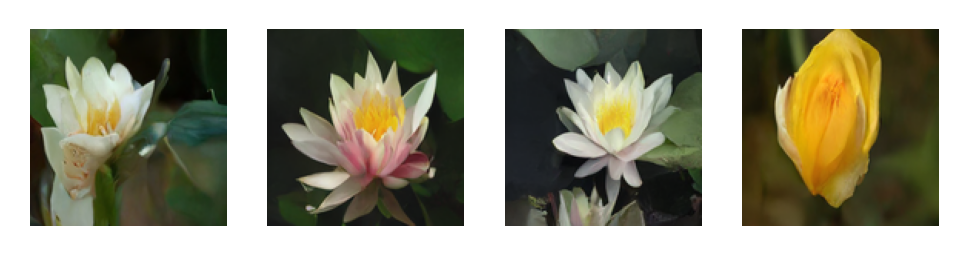

In [16]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily', 
    'a photo of a rose'
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=2, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)


Using classifier-free guidance


100%|██████████| 200/200 [00:09<00:00, 21.47it/s]


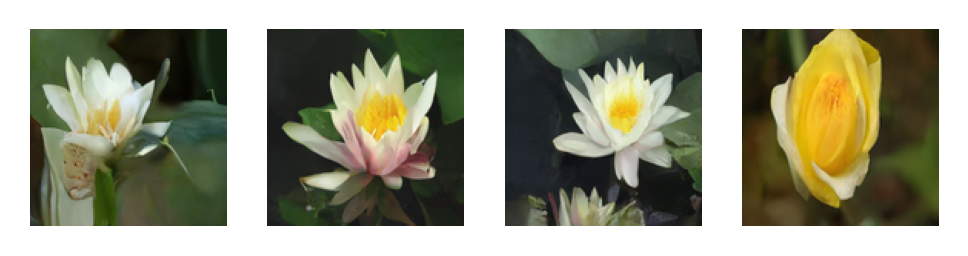

In [19]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily', 
    'a photo of a rose'
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.best_state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=2, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)


Using classifier-free guidance


100%|██████████| 200/200 [00:24<00:00,  8.19it/s]


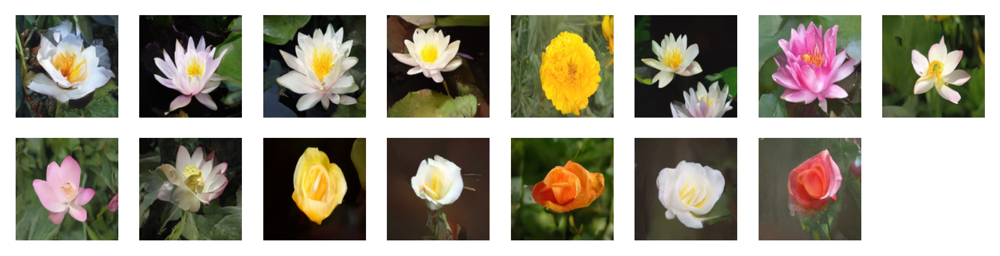

In [20]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily', 
    'a water lily', 
    'a photo of a marigold', 
    'a water lily',
    'a water lily',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=2, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)


Using classifier-free guidance


100%|██████████| 200/200 [00:22<00:00,  8.92it/s]


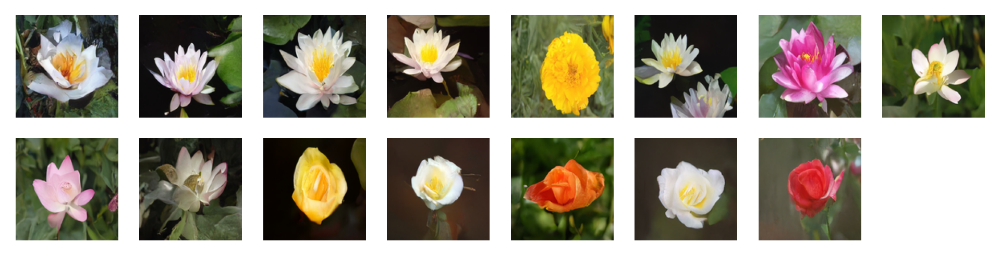

In [17]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily', 
    'a water lily', 
    'a photo of a marigold', 
    'a water lily',
    'a water lily',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=2, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)


Using classifier-free guidance


100%|██████████| 200/200 [00:22<00:00,  8.91it/s]


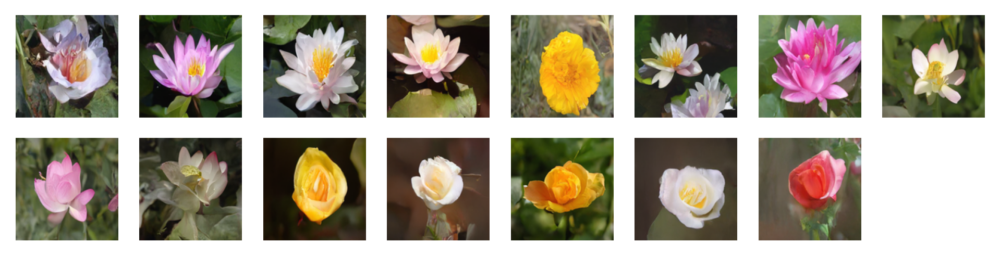

In [45]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily', 
    'a water lily', 
    'a photo of a marigold', 
    'a water lily',
    'a water lily',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=2, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)

Using classifier-free guidance


100%|██████████| 200/200 [00:16<00:00, 12.11it/s]


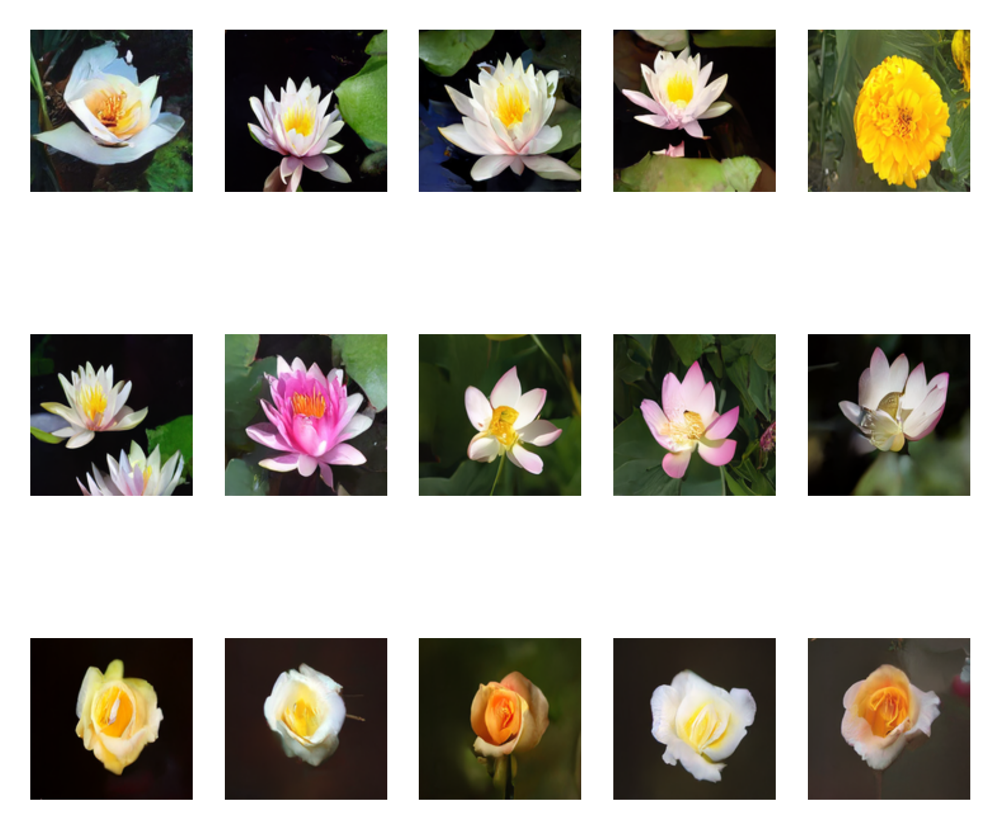

In [24]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily', 
    'a water lily', 
    'a photo of a marigold', 
    'a water lily',
    'a water lily',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=4, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=500, fig_size=(4, 5))

Using classifier-free guidance


100%|██████████| 200/200 [00:19<00:00, 10.27it/s]


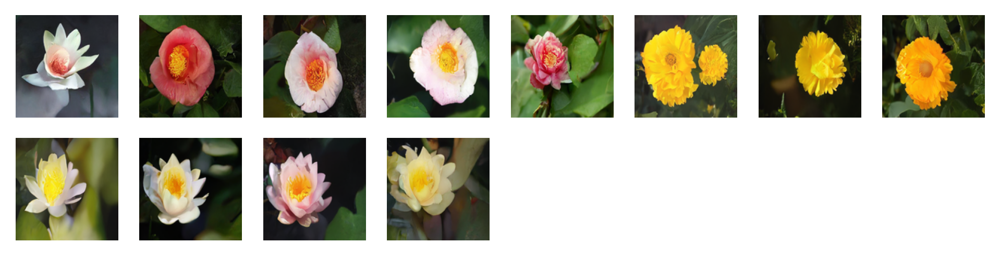

In [22]:
prompts = [
    'water tulip',
    'a green water rose',
    'a green water rose',
    'a green water rose',
    'a water red rose', 
    'a marigold and rose hybrid', 
    'a marigold and rose hybrid', 
    'a marigold and rose hybrid', 
    'a water lily and a marigold',
    'a water lily and a marigold',
    'a water lily and a marigold',
    'a water lily and a marigold',
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=3, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)

Using classifier-free guidance


100%|██████████| 200/200 [00:57<00:00,  3.49it/s]


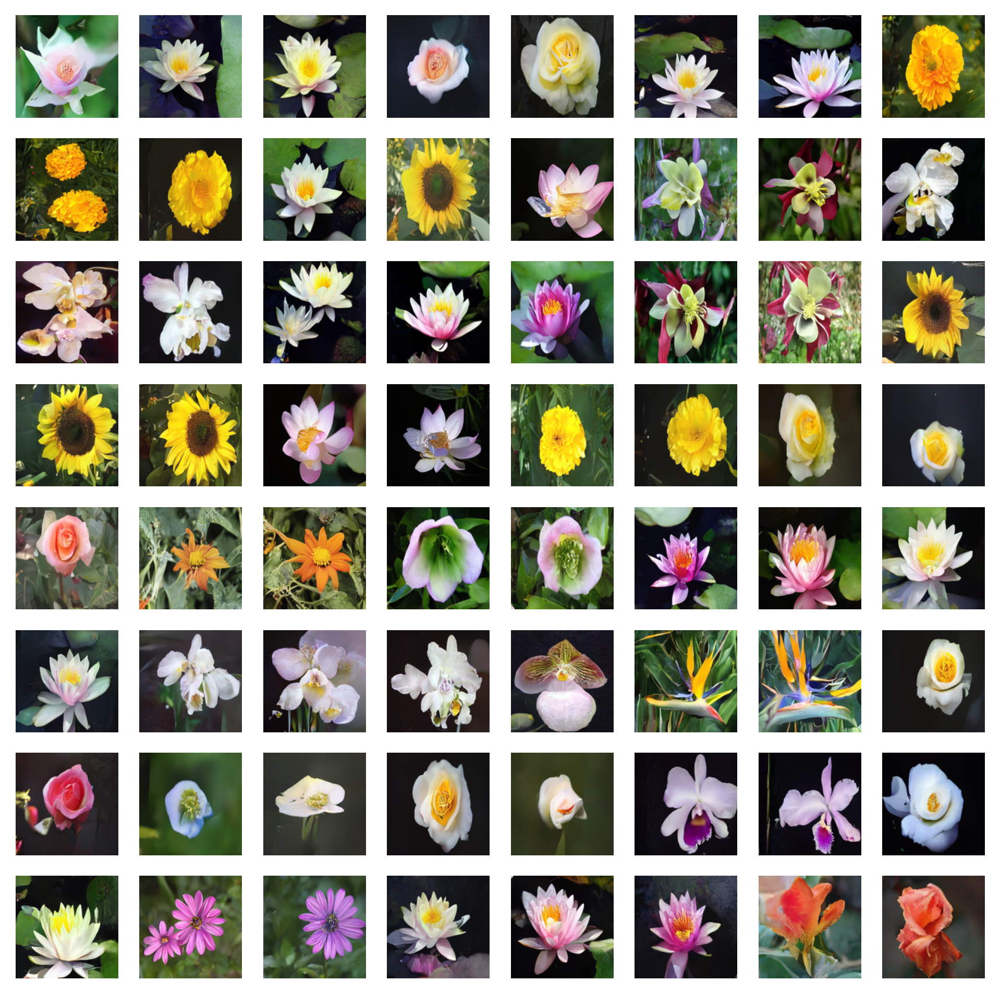

In [32]:
prompts = [
    'water tulip',
    'a water lily',
    'a water lily',
    'a photo of a rose',
    'a photo of a rose',
    'a water lily', 
    'a water lily', 
    'a photo of a marigold', 
    'a photo of a marigold', 
    'a photo of a marigold', 
    'a water lily',
    'a photo of a sunflower',
    'a photo of a lotus',
    "columbine",
    "columbine",
    "an orchid",
    "an orchid",
    "an orchid",
    'a water lily', 
    'a water lily', 
    'a water lily', 
    "columbine",
    "columbine",
    'a photo of a sunflower',
    'a photo of a sunflower',
    'a photo of a sunflower',
    'a photo of a lotus',
    'a photo of a lotus',
    'a photo of a marigold', 
    'a photo of a marigold', 
    'a photo of a rose',
    'a photo of a rose',
    'a photo of a rose',
    "orange dahlia",
    "orange dahlia",
    "a lenten rose",
    "a lenten rose",
    'a water lily', 
    'a water lily', 
    'a water lily', 
    'a water lily', 
    "an orchid",
    "an orchid",
    "an orchid",
    'hard-leaved pocket orchid',
    "bird of paradise",
    "bird of paradise",
    "a photo of a lovely rose",
    "a photo of a lovely rose",
    "a photo of a globe-flower",
    "a photo of a globe-flower",
    "a photo of a lovely rose",
    "a photo of a lovely rose",
    "a photo of a ruby-lipped cattleya",
    "a photo of a ruby-lipped cattleya",
    "a photo of a lovely rose",
    'a water lily', 
    'a osteospermum', 
    'a osteospermum', 
    'a water lily', 
    'a water lily', 
    'a water lily', 
    "a red rose",
    "a red rose",
    ]
pooled_labels, labels_seq = encodePrompts(prompts, textEncoderModel, textTokenizer)

sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform, guidance_scale=4, null_labels_seq=data['null_labels_full'])
samples = sampler.generate_images(num_images=len(prompts), diffusion_steps=200, start_step=1000, end_step=0, priors=None, model_conditioning_inputs=(labels_seq,))
plotImages(samples, dpi=300)

In [31]:
dataToLabelGenMap["oxford_flowers102"]()

['pink primrose',
 'hard-leaved pocket orchid',
 'canterbury bells',
 'sweet pea',
 'english marigold',
 'tiger lily',
 'moon orchid',
 'bird of paradise',
 'monkshood',
 'globe thistle',
 'snapdragon',
 "colt's foot",
 'king protea',
 'spear thistle',
 'yellow iris',
 'globe-flower',
 'purple coneflower',
 'peruvian lily',
 'balloon flower',
 'giant white arum lily',
 'fire lily',
 'pincushion flower',
 'fritillary',
 'red ginger',
 'grape hyacinth',
 'corn poppy',
 'prince of wales feathers',
 'stemless gentian',
 'artichoke',
 'sweet william',
 'carnation',
 'garden phlox',
 'love in the mist',
 'mexican aster',
 'alpine sea holly',
 'ruby-lipped cattleya',
 'cape flower',
 'great masterwort',
 'siam tulip',
 'lenten rose',
 'barbeton daisy',
 'daffodil',
 'sword lily',
 'poinsettia',
 'bolero deep blue',
 'wallflower',
 'marigold',
 'buttercup',
 'oxeye daisy',
 'common dandelion',
 'petunia',
 'wild pansy',
 'primula',
 'sunflower',
 'pelargonium',
 'bishop of llandaff',
 'gaura',

100%|██████████| 200/200 [00:14<00:00, 13.34it/s]


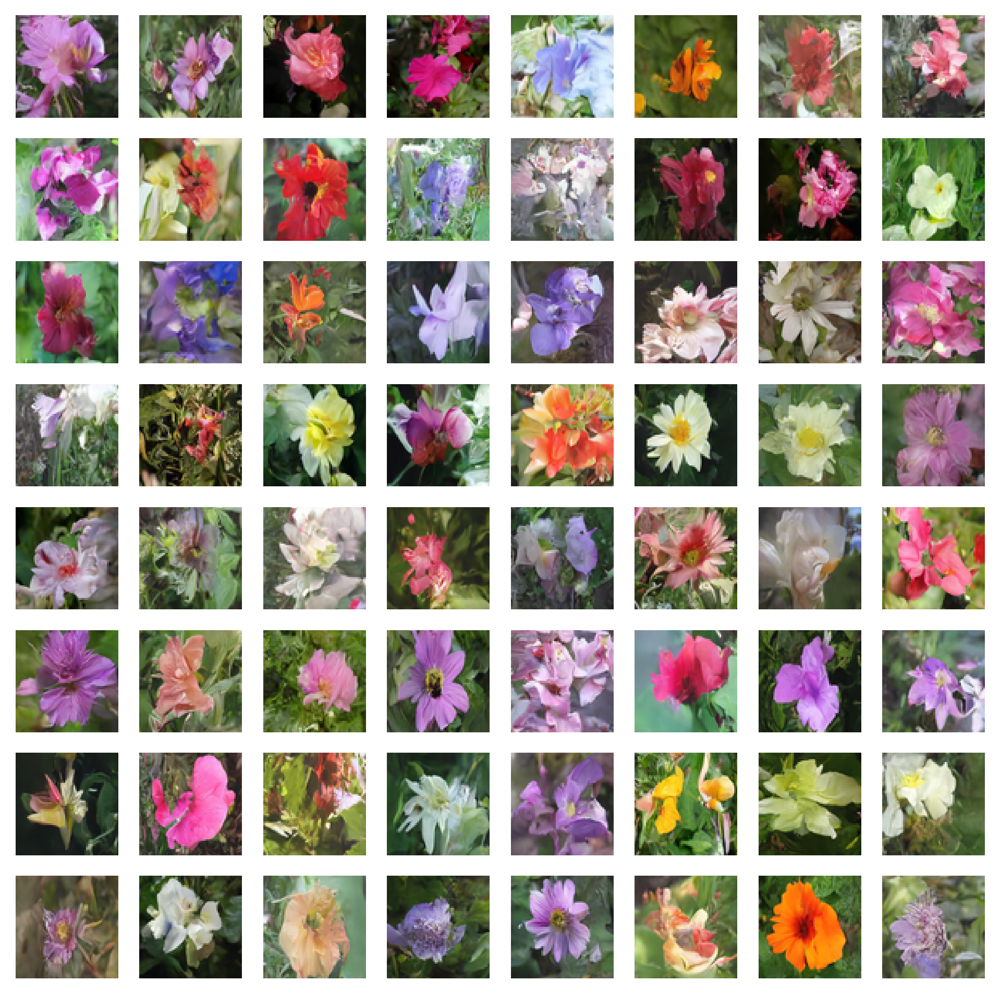

In [20]:
sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, diffusion_steps=200, start_step=1000, end_step=0, priors=None)
plotImages(samples, dpi=300)

In [ ]:
sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, diffusion_steps=200, start_step=1000, end_step=0, priors=None)
plotImages(samples, dpi=300)

In [ ]:
sampler = RK4Sampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, diffusion_steps=6, start_step=1000, end_step=0, priors=None)
plotImages(samples, dpi=300)

In [ ]:
sampler = EulerAncestralSampler(trainer.model, trainer.state.ema_params, karas_ve_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, diffusion_steps=300, start_step=1000, end_step=0, priors=None)
plotImages(samples, dpi=300)

In [ ]:
sampler = DDPMSampler(trainer.model, trainer.state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

In [ ]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=16, start_step=1000, priors=None)
plotImages(samples, dpi=300)

In [ ]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule, model_output_transform=trainer.model_output_transform)
samples = sampler.generate_images(num_images=64, start_step=1000, priors=None)
plotImages(samples)